In [1]:
%load_ext dotenv
%dotenv

import tqdm
import flax
from flax import linen as nn
import jax
from typing import Dict, Callable, Sequence, Any, Union
from dataclasses import field
import jax.numpy as jnp
import tensorflow_datasets as tfds
import tensorflow as tf

import matplotlib.pyplot as plt
import einops
import clu
from clu import parameter_overview, metrics
from flax.training import train_state  # Useful dataclass to keep train state
import optax
from flax import struct                # Flax dataclasses
import time
import os
from datetime import datetime
import orbax
from flax.training import orbax_utils
import numpy as np
from einops import rearrange


2024-07-05 23:45:40.406470: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Initialization

In [2]:
# Some Optimizations
import ctypes

_libcudart = ctypes.CDLL("libcudart.so")
# Set device limit on the current device
# cudaLimitMaxL2FetchGranularity = 0x05
pValue = ctypes.cast((ctypes.c_int * 1)(), ctypes.POINTER(ctypes.c_int))
_libcudart.cudaDeviceSetLimit(ctypes.c_int(0x05), ctypes.c_int(128))
_libcudart.cudaDeviceGetLimit(pValue, ctypes.c_int(0x05))
assert pValue.contents.value == 128
tf.compat.v1.ConfigProto.force_gpu_compatible = True

gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices("GPU")
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


I0000 00:00:1720203341.944784  444059 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1720203341.974357  444059 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1720203342.010688  444059 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1720203342.012658  444059 cuda_executor.cc:1020] successful NUMA node read from SysFS ha

In [3]:
normalizeImage = lambda x: jax.nn.standardize(x, mean=[127.5], std=[127.5])
denormalizeImage = lambda x: (x + 1.0) * 127.5


def plotImages(imgs, fig_size=(8, 8), dpi=100):
    fig = plt.figure(figsize=fig_size, dpi=dpi)
    imglen = imgs.shape[0]
    for i in range(imglen):
        plt.subplot(fig_size[0], fig_size[1], i + 1)
        plt.imshow(tf.cast(denormalizeImage(imgs[i, :, :, :]), tf.uint8))
        plt.axis("off")
    plt.show()

class RandomClass():
    def __init__(self, rng: jax.random.PRNGKey):
        self.rng = rng

    def get_random_key(self):
        self.rng, subkey = jax.random.split(self.rng)
        return subkey
    
    def set_random_key(self, seed):
        self.rng = jax.random.PRNGKey(seed)

    def reset_random_key(self):
        self.rng = jax.random.PRNGKey(42)

class MarkovState(struct.PyTreeNode):
    pass

class RandomMarkovState(MarkovState):
    rng: jax.random.PRNGKey

    def get_random_key(self):
        rng, subkey = jax.random.split(self.rng)
        return RandomMarkovState(rng), subkey

# Data Pipeline

In [4]:
def get_dataset(data_name="celeb_a", batch_size=64, image_scale=256):
    def augmenter(image_scale=256, method="area"):
        @tf.function()
        def augment(sample):
            image = (
                tf.cast(sample["image"], tf.float32) - 127.5
            ) / 127.5
            image = tf.image.resize(
                image, [image_scale, image_scale], method=method, antialias=True
            )
            image = tf.image.random_flip_left_right(image)
            image = tf.image.random_contrast(image, 0.999, 1.05)
            image = tf.image.random_brightness(image, 0.2)

            image = tf.clip_by_value(image, -1.0, 1.0)
            return image
        return augment

    # Load CelebA Dataset
    data: tf.data.Dataset = tfds.load(data_name, split="all", shuffle_files=True)
    final_data = (
        data
        .cache()  # Cache after augmenting to avoid recomputation
        # .prefetch(tf.data.experimental.AUTOTUNE)
        # .batch(128, num_parallel_calls=tf.data.AUTOTUNE)
        .map(
            augmenter(image_scale, method="area"),
            num_parallel_calls=tf.data.AUTOTUNE,
        )
        .repeat()  # Repeats the dataset indefinitely
        # .unbatch()
        .shuffle(4096)  # Ensure this is adequate for your dataset size
        .batch(batch_size, drop_remainder=True)
        .prefetch(tf.data.experimental.AUTOTUNE)
    ).as_numpy_iterator()
    return final_data, len(data)


# Noise Samplers

In [5]:
from flaxdiff.schedulers import CosineNoiseSchedule, LinearNoiseSchedule, NoiseScheduler, DiscreteNoiseScheduler
from flaxdiff.predictors import VPredictionTransform, EpsilonPredictionTransform, DiffusionPredictionTransform

ModuleNotFoundError: No module named 'flaxdiff'

In [6]:

def cosine_beta_schedule(timesteps, start_angle=0.008, end_angle=0.999):
    ts = np.linspace(0, 1, timesteps + 1, dtype=np.float64)
    alphas_bar = np.cos((ts + start_angle) / (1 + start_angle) * np.pi /2) ** 2
    # alphas_bar = np.exp(ts * -12.0)
    alphas_bar = alphas_bar/alphas_bar[0]
    betas = 1 - (alphas_bar[1:] / alphas_bar[:-1])
    return np.clip(betas, 0, end_angle)

def alpha_bar_fn(t):
    # return np.cos((t + 0.008) / 1.008 * np.pi / 2) ** 2
    return np.exp(t * -12.0)

def exp_beta_schedule(timesteps, beta_start=0.0001, beta_end=0.999):
    betas = []
    for i in range(timesteps):
        t1 = i / timesteps
        t2 = (i + 1) / timesteps
        betas.append(min(1 - alpha_bar_fn(t2) / alpha_bar_fn(t1), beta_end))
    return np.array(betas)

class ExpNoiseSchedule(DiscreteNoiseScheduler):
    def __init__(self, timesteps, beta_start=0.0001, beta_end=0.02, *args, **kwargs):
        super().__init__(timesteps, beta_start, beta_end, schedule_fn=cosine_beta_schedule, *args, **kwargs)


[[[[2.6166439e-05]]]] 1.0 (Array([[[[0.]]]], dtype=float32), Array([[[[1.]]]], dtype=float32)) (Array([[[[0.]]]], dtype=float32), Array([[[[1.]]]], dtype=float32))


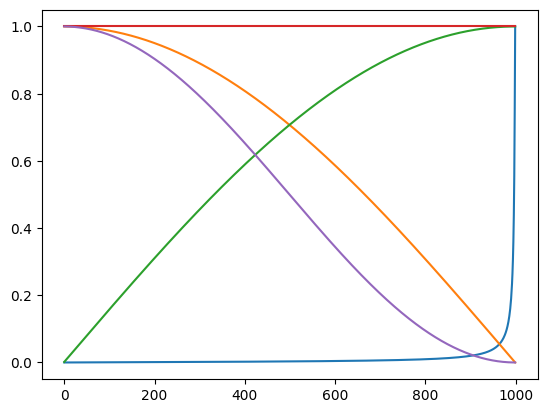

In [61]:
schedule = ExpNoiseSchedule(1000, beta_end=1)
plt.plot(schedule.betas)
plt.plot([schedule.get_rates(i, shape=()) for i in range(1000)])
get_variance = lambda rates: rates[0] ** 2 + rates[1] ** 2
plt.plot([get_variance(schedule.get_rates(i, shape=())) for i in range(1000)])
plt.plot(schedule.alpha_cumprod)
deltas = []
for i in range(1000):
    signal, noise = schedule.get_rates(i)
    deltas.append(jnp.abs(1 - (signal**2 + noise**2)))
print(sum(deltas), schedule.betas[-1], schedule.get_rates(999), schedule.get_rates(1000))

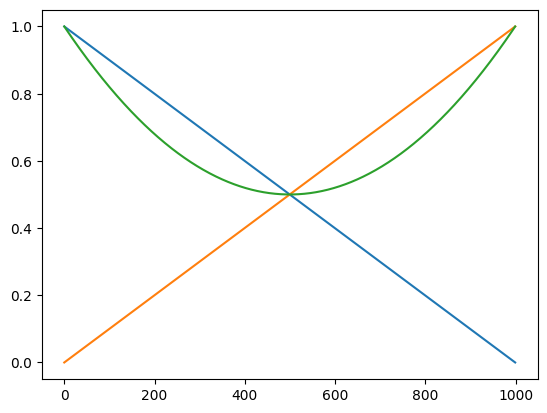

In [62]:
schedule = DiscreteSubVarianceNoiseScheduler(1000, beta_end=1)
# plt.plot(schedule.betas)
plt.plot([schedule.get_rates(i, shape=()) for i in range(1000)])
get_variance = lambda rates: rates[0] ** 2 + rates[1] ** 2
plt.plot([get_variance(schedule.get_rates(i, shape=())) for i in range(1000)])
# plt.plot(schedule.alpha_cumprod)
deltas = []
for i in range(1000):
    signal, noise = schedule.get_rates(i)
    deltas.append(jnp.abs(1 - (signal**2 + noise**2)))
# print(sum(deltas), schedule.betas[-1], schedule.get_rates(999), schedule.get_rates(1000))

# Data Diffusion Testing

In [ ]:
# Visualize adding some noise to some sample images and then removing it
state = RandomMarkovState(jax.random.PRNGKey(4))
data, _ = get_dataset("oxford_flowers102", batch_size=64, image_scale=64)
images = next(iter(data))
plotImages(images)
noise_level = 900# * jnp.ones((images.shape[0], ), dtype=jnp.int32)
noise_level_max = 1000
schedule = DiscreteSubVarianceNoiseScheduler(noise_level_max)
state, rng = state.get_random_key()
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float64)
noisy_images = schedule.add_noise(images, noise, noise_level)
plotImages(noisy_images)
plotImages(noise)
reconstructed_images = schedule.remove_all_noise(noisy_images, noise, noise_level)
plotImages(reconstructed_images)


# Modeling

## Metrics

## Callbacks

## Model Generator

In [7]:
from flaxdiff.models import ConvLayer, TimeEmbedding, TimeProjection, Upsample, Downsample, AttentionBlock, ResidualBlock, kernel_init, PixelShuffle

class Upsample(nn.Module):
    features:int
    scale:int
    activation:Callable=jax.nn.swish

    @nn.compact
    def __call__(self, x, residual=None):
        out = x
        # out = PixelShuffle(scale=self.scale)(out)
        B, H, W, C = x.shape
        out = jax.image.resize(x, (B, H * self.scale, W * self.scale, C), method="nearest")
        out = ConvLayer(
            "conv",
            features=self.features,
            kernel_size=(1, 1),
            strides=(1, 1),
        )(out)
        if residual is not None:
            out = jnp.concatenate([out, residual], axis=-1)
        return out

class Downsample(nn.Module):
    features:int
    scale:int
    activation:Callable=jax.nn.swish

    @nn.compact
    def __call__(self, x, residual=None):
        out = ConvLayer(
            "conv",
            features=self.features,
            kernel_size=(4, 4),
            strides=(2, 2)
        )(x)
        if residual is not None:
            if residual.shape[1] > out.shape[1]:
                residual = nn.avg_pool(residual, window_shape=(2, 2), strides=(2, 2), padding="SAME")
            out = jnp.concatenate([out, residual], axis=-1)
        return out


def l2norm(t, axis=1, eps=1e-12):
    denom = jnp.clip(jnp.linalg.norm(t, ord=2, axis=axis, keepdims=True), eps)
    out = t/denom
    return (out)

class Attention(nn.Module):
    heads: int = 4
    dim_head: int = 32
    scale: int = 10
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        B, H, W, C = x.shape
        dim = self.dim_head * self.heads

        qkv = nn.Conv(features= dim * 3, kernel_size=(1, 1),
                      use_bias=False, dtype=self.dtype, name='to_qkv.conv_0')(x)  # [B, H, W, dim *3]
        q, k, v = jnp.split(qkv, 3, axis=-1)  # [B, H, W, dim]
        q, k, v = map(lambda t: einops.rearrange(
            t, 'b x y (h d) -> b (x y) h d', h=self.heads), (q, k, v))

        assert q.shape == k.shape == v.shape == (
            B, H * W, self.heads, self.dim_head)

        q, k = map(l2norm, (q, k))

        sim = jnp.einsum('b i h d, b j h d -> b h i j', q, k) * self.scale
        attn = nn.softmax(sim, axis=-1)
        assert attn.shape == (B, self.heads, H * W,  H * W)

        out = jnp.einsum('b h i j , b j h d  -> b h i d', attn, v)
        out = einops.rearrange(out, 'b h (x y) d -> b x y (h d)', x=H)
        assert out.shape == (B, H, W, dim)

        out = nn.Conv(features=C, kernel_size=(1, 1), dtype=self.dtype, name='to_out.conv_0')(out)
        return (out)

class LinearAttention(nn.Module):
    heads: int = 4
    dim_head: int = 32
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        B, H, W, C = x.shape
        dim = self.dim_head * self.heads

        qkv = nn.Conv(
            features=dim * 3,
            kernel_size=(1, 1),
            use_bias=False,
            dtype=self.dtype,
            name='to_qkv.conv_0')(x)  # [B, H, W, dim *3]
        q, k, v = jnp.split(qkv, 3, axis=-1)  # [B, H, W, dim]
        q, k, v = map(lambda t: einops.rearrange(
            t, 'b x y (h d) -> b (x y) h d', h=self.heads), (q, k, v))
        assert q.shape == k.shape == v.shape == (
            B, H * W, self.heads, self.dim_head)
        # compute softmax for q along its embedding dimensions
        q = nn.softmax(q, axis=-1)
        # compute softmax for k along its spatial dimensions
        k = nn.softmax(k, axis=-3)

        q = q/jnp.sqrt(self.dim_head)
        v = v / (H * W)

        context = jnp.einsum('b n h d, b n h e -> b h d e', k, v)
        out = jnp.einsum('b h d e, b n h d -> b h e n', context, q)
        out = einops.rearrange(out, 'b h e (x y) -> b x y (h e)', x=H)
        assert out.shape == (B, H, W, dim)

        out = nn.Conv(features=C, kernel_size=(1, 1),  dtype=self.dtype, name='to_out.conv_0')(out)
        out = nn.LayerNorm(epsilon=1e-5, use_bias=False, dtype=self.dtype, name='to_out.norm_0')(out)
        return (out)

# class AttentionBlock(nn.Module):
#     heads: int = 4
#     dim_head: int = 32
#     use_linear_attention: bool = True
#     dtype: Any = jnp.float32


#     @nn.compact
#     def __call__(self, x):
#       B, H, W, C = x.shape
#       normed_x = nn.LayerNorm(epsilon=1e-5, use_bias=False,dtype=self.dtype)(x)
#       if self.use_linear_attention:
#         attn = LinearAttention(self.heads, self.dim_head, dtype=self.dtype)
#       else:
#         attn = Attention(self.heads, self.dim_head, dtype=self.dtype)
#       out = attn(normed_x)
#       assert out.shape == (B, H, W, C)
#       return(out + x)

class AttentionBlock(nn.Module):
    heads: int = 4
    dim_head: int = 32
    use_linear_attention: bool = True
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        normed_x = nn.RMSNorm(dtype=self.dtype)(x)
        attention = nn.MultiHeadAttention(num_heads=self.heads, precision='high', decode=False)(normed_x)
        out = x + attention
        return out

class ResidualBlock(nn.Module):
    conv_type:str
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    padding:str="SAME"
    activation:Callable=jax.nn.swish
    direction:str=None
    res:int=2
    norm_groups:int=8
    kernel_init:Callable=kernel_init(1.0)

    @nn.compact
    def __call__(self, x:jax.Array, temb:jax.Array, extra_features:jax.Array=None):
        residual = x
        out = nn.GroupNorm(self.norm_groups)(x)
        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv1"
        )(out)
        out = nn.GroupNorm(self.norm_groups)(out)

        temb = nn.DenseGeneral(features=self.features*2, name="temb_projection")(temb)
        temb = temb[:, None, None, :]
        scale, shift = jnp.split(temb, 2, axis=-1)
        out = out * (1 + scale) + shift

        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv2"
        )(out)

        if residual.shape != out.shape:
            residual = ConvLayer(
                self.conv_type,
                features=self.features,
                kernel_size=(1, 1),
                strides=1,
                kernel_init=self.kernel_init,
                name="residual_conv"
            )(residual)
        out = out + residual

        out = jnp.concatenate([out, extra_features], axis=-1) if extra_features is not None else out

        return out

class Unet(nn.Module):
    emb_features:int=64*4,
    feature_depths:list=[64, 128, 256, 512],
    attention_configs:list=[{"heads":8}, {"heads":8}, {"heads":8}, {"heads":8}],
    num_res_blocks:int=2,
    num_middle_res_blocks:int=1,
    activation:Callable = jax.nn.swish
    norm_groups:int=8

    @nn.compact
    def __call__(self, x, temb):
        # print("embedding features", self.emb_features)
        temb = TimeEmbedding(features=self.emb_features)(temb)
        temb = TimeProjection(features=self.emb_features)(temb)
        # print("time embedding", temb.shape)
        feature_depths = self.feature_depths
        attention_configs = self.attention_configs
        x = ConvLayer(
            "conv",
            features=self.feature_depths[0],
            kernel_size=(7, 7),
            strides=(1, 1),
            kernel_init=kernel_init(1.0)
        )(x)
        downs = [x]

        # Downscaling blocks
        for i, (dim_out, attention_config) in enumerate(zip(feature_depths, attention_configs)):
            dim_in = x.shape[-1]
            # dim_in = dim_out
            for j in range(self.num_res_blocks):
                x = ResidualBlock(
                    "conv",
                    name=f"down_{i}_residual_{j}",
                    features=dim_in,
                    kernel_init=kernel_init(1.0),
                    kernel_size=(3, 3),
                    strides=(1, 1),
                    activation=self.activation,
                    norm_groups=self.norm_groups
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    x = AttentionBlock(heads=attention_config['heads'], name=f"down_{i}_attention_{j}")(x)
                # print("down residual for feature level", i, "is of shape", x.shape, "features", dim_in)
                downs.append(x)
            if i != len(feature_depths) - 1:
                # print("Downsample", i, x.shape)
                x = Downsample(
                    features=dim_out,
                    scale=2,
                    activation=self.activation,
                    name=f"down_{i}_downsample"
                )(x)

        # Middle Blocks
        middle_dim_out = self.feature_depths[-1]
        middle_attention = self.attention_configs[-1]
        # x = nn.GroupNorm(8)(x)
        x = ConvLayer(
            "conv",
            features=middle_dim_out,
            kernel_size=(3, 3),
            strides=(1, 1),
            kernel_init=kernel_init(1.0),
            name="middle_conv"
        )(x)
        for j in range(self.num_middle_res_blocks):
            x = ResidualBlock(
                "conv",
                name=f"middle_res1_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
                norm_groups=self.norm_groups
            )(x, temb)
            if middle_attention is not None and j == self.num_middle_res_blocks - 1:   # Apply attention only on the last block
                x = AttentionBlock(heads=attention_config['heads'], use_linear_attention=False, name=f"middle_attention_{j}")(x)
            x = ResidualBlock(
                "conv",
                name=f"middle_res2_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
                norm_groups=self.norm_groups
            )(x, temb)

        # Upscaling Blocks
        for i, (dim_out, attention_config) in enumerate(zip(reversed(feature_depths), reversed(attention_configs))):
            # print("Upscaling", i, "features", dim_out)
            for j in range(self.num_res_blocks):
                x = jnp.concatenate([x, downs.pop()], axis=-1)
                # print("concat==> ", i, "concat", x.shape)
                # kernel_size = (1 + 2 * (j + 1), 1 + 2 * (j + 1))
                kernel_size = (3, 3)
                x = ResidualBlock(
                    "conv",# if j == 0 else "separable",
                    name=f"up_{i}_residual_{j}",
                    features=dim_out,
                    kernel_init=kernel_init(1.0),
                    kernel_size=kernel_size,
                    strides=(1, 1),
                    activation=self.activation,
                    norm_groups=self.norm_groups
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    x = AttentionBlock(heads=attention_config['heads'], name=f"up_{i}_attention_{j}")(x)
            # print("Upscaling ", i, x.shape)
            if i != len(feature_depths) - 1:
                x = Upsample(
                    features=feature_depths[-i],
                    scale=2,
                    activation=self.activation,
                    name=f"up_{i}_upsample"
                )(x)

        # x = nn.GroupNorm(8)(x)
        x = ConvLayer(
            "conv",
            features=self.feature_depths[0],
            kernel_size=(3, 3),
            strides=(1, 1),
            kernel_init=kernel_init(0.0)
        )(x)
    
        x = jnp.concatenate([x, downs.pop()], axis=-1)

        x = ResidualBlock(
            "conv",
            name="final_residual",
            features=self.feature_depths[0],
            kernel_init=kernel_init(1.0),
            kernel_size=(3,3),
            strides=(1, 1),
            activation=self.activation,
            norm_groups=self.norm_groups
        )(x, temb)

        x = nn.GroupNorm(self.norm_groups)(x)
        x = self.activation(x)

        noise_out = ConvLayer(
            "conv",
            features=3,
            kernel_size=(1, 1),
            strides=(1, 1),
            # activation=jax.nn.mish
            kernel_init=kernel_init(0.0)
        )(x)
        return noise_out#, attentions

# Training

In [8]:
BATCH_SIZE = 16
IMAGE_SIZE = 64

cosine_schedule = CosineNoiseSchedule(1000, beta_end=1)
linear_schedule = LinearNoiseSchedule(1000)
# subvp_schedule = DiscreteSubVarianceNoiseScheduler(1000)

In [9]:
import orbax.checkpoint


@struct.dataclass
class Metrics(metrics.Collection):
  loss: metrics.Average.from_output('loss') # type: ignore

class ModelState():
    model: nn.Module
    params: dict
    noise_schedule: NoiseScheduler
    model_output_transform: DiffusionPredictionTransform

class TrainState(train_state.TrainState):
    rngs:jax.random.PRNGKey
    
    def get_random_key(self):
        rngs, subkey = jax.random.split(self.rngs)
        return self.replace(rngs=rngs), subkey

class DiffusionTrainer:
    state : TrainState
    best_state : TrainState
    best_loss : float
    model : nn.Module
    noise_schedule : NoiseScheduler
    model_output_transform:DiffusionPredictionTransform
    
    def __init__(self, 
                 model:nn.Module, 
                 optimizer: optax.GradientTransformation,
                 noise_schedule:NoiseScheduler,
                 rngs:jax.random.PRNGKey,
                 train_state:TrainState=None,
                 name:str="Diffusion",
                 load_from_checkpoint:bool=False,
                 p2_loss_weight_k:float=1,
                 p2_loss_weight_gamma:float=1,
                 param_transforms:Callable=None,
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform(),
                 loss_fn=optax.l2_loss
                 ):
        self.model = model
        self.noise_schedule = noise_schedule
        self.name = name
        self.p2_loss_weights = self.noise_schedule.get_p2_weights(p2_loss_weight_k, p2_loss_weight_gamma)
        self.model_output_transform = model_output_transform
        self.loss_fn = loss_fn

        checkpointer = orbax.checkpoint.PyTreeCheckpointer()
        options = orbax.checkpoint.CheckpointManagerOptions(max_to_keep=4, create=True)
        self.checkpointer = orbax.checkpoint.CheckpointManager(self.checkpoint_path(), checkpointer, options)

        if load_from_checkpoint:
            params = self.load()
        else:
            params = None

        if train_state == None:
            self.init_state(optimizer, rngs, params=params, model=model, param_transforms=param_transforms)
        else:
            self.state = train_state
            self.best_state = train_state
            self.best_loss = 1e9

    def init_state(self, 
                   optimizer: optax.GradientTransformation, 
                   rngs:jax.random.PRNGKey,
                   params:dict=None,
                   model:nn.Module=None,
                     param_transforms:Callable=None,
                   ):
        inp = jnp.ones((BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        temb = jnp.ones((BATCH_SIZE,))
        rngs, subkey = jax.random.split(rngs)
        if params == None:
            params = model.init(subkey, inp, temb)
        if param_transforms is not None:
            params = param_transforms(params)
        self.best_loss = 1e9
        self.state = TrainState.create(
            apply_fn=model.apply,
            params=params,
            tx=optimizer,
            rngs=rngs,
        )
        self.best_state = self.state

    def checkpoint_path(self):
        experiment_name = self.name
        path = os.path.join(os.path.abspath('./models'), experiment_name)
        if not os.path.exists(path):
            os.makedirs(path)
        return path

    def load(self):
        step = self.checkpointer.latest_step()
        print("Loading model from checkpoint", step)
        ckpt = self.checkpointer.restore(step)
        state = ckpt['state']
        # Convert the state to a TrainState
        self.best_loss = ckpt['best_loss']
        print(f"Loaded model from checkpoint at step {step}", ckpt['best_loss'])
        return state.get('params', None)#, ckpt.get('model', None)

    def save(self, epoch=0, best=False):
        print(f"Saving model at epoch {epoch}")
        state = self.best_state if best else self.state
        # filename = os.path.join(self.checkpoint_path(), f'model_{epoch}' if not best else 'best_model')
        ckpt = {
            'model': self.model,
            'state': state,
            'best_loss': self.best_loss
        }
        save_args = orbax_utils.save_args_from_target(ckpt)
        self.checkpointer.save(epoch, ckpt, save_kwargs={'save_args': save_args})

    def summary(self):
        inp = jnp.ones((1, IMAGE_SIZE, IMAGE_SIZE, 3))
        temb = jnp.ones((1,))
        print(self.model.tabulate(jax.random.key(0), inp, temb, console_kwargs={"width": 200, "force_jupyter":True, }))

    def _define_train_step(self):
        noise_schedule = self.noise_schedule
        model = self.model
        p2_loss_weights = self.p2_loss_weights
        model_output_transform = self.model_output_transform
        loss_fn = self.loss_fn
        @jax.jit
        def train_step(state:TrainState, batch):
            """Train for a single step."""
            images = batch
            noise_level, state = noise_schedule.generate_timesteps(images.shape[0], state)
            state, rngs = state.get_random_key()
            noise:jax.Array = jax.random.normal(rngs, shape=images.shape)
            noisy_images, expected_output = model_output_transform.train_step(images, noise, noise_level, noise_schedule)
            def model_loss(params):
                preds = model.apply(params, noisy_images, noise_schedule.transform_steps(noise_level))
                nloss = jnp.mean(loss_fn(preds.reshape((1, -1)), expected_output.reshape((1, -1))), axis=1)
                nloss *= p2_loss_weights[noise_level]
                nloss = jnp.mean(nloss)
                loss = nloss
                return loss
            loss, grads = jax.value_and_grad(model_loss)(state.params)
            state = state.apply_gradients(grads=grads) 
            return state, loss
        return train_step
    
    def _define_compute_metrics(self):
        @jax.jit
        def compute_metrics(state:TrainState, expected, pred):
            loss = jnp.mean(jnp.square(pred - expected))
            metric_updates = state.metrics.single_from_model_output(loss=loss)
            metrics = state.metrics.merge(metric_updates)
            state = state.replace(metrics=metrics)
            return state
        return compute_metrics

    def fit(self, data, steps_per_epoch, epochs):
        data = iter(data)
        train_step = self._define_train_step()
        compute_metrics = self._define_compute_metrics()
        state = self.state
        for epoch in range(epochs):
            print(f"\nEpoch {epoch+1}/{epochs}")
            start_time = time.time()
            epoch_loss = 0
            with tqdm.tqdm(total=steps_per_epoch, desc=f'\t\tEpoch {epoch+1}', ncols=100, unit='step') as pbar:
                for i in range(steps_per_epoch):
                    batch = next(data)
                    state, loss = train_step(state, batch)
                    epoch_loss += loss
                    if i % 100 == 0:
                        pbar.set_postfix(loss=f'{loss:.4f}')
                        pbar.update(100)
            end_time = time.time()
            self.state = state
            total_time = end_time - start_time
            avg_time_per_step = total_time / steps_per_epoch
            avg_loss = epoch_loss / steps_per_epoch
            if avg_loss < self.best_loss:
                self.best_loss = avg_loss
                self.best_state = state
                self.save(epoch, best=True)
            print(f"\n\tEpoch {epoch+1} completed. Avg Loss: {avg_loss}, Time: {total_time:.2f}s, Best Loss: {self.best_loss}")
        return self.state


In [10]:
experiment_name = 'Diffusion_2024-06-23_16:22:53'
print("Experiment_Name:", experiment_name)
unet = Unet(emb_features=256, 
            feature_depths=[64, 128, 256, 512],
            attention_configs=[{"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}],
            num_res_blocks=2,
            num_middle_res_blocks=1
)
# solver = optax.lookahead(optax.adam(2e-4), sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)
solver = optax.adamw(2e-4)
trainer = DiffusionTrainer(unet, optimizer=solver, 
                           noise_schedule=cosine_schedule,
                           rngs=jax.random.PRNGKey(4), 
                           name=experiment_name,
                           model_output_transform=VPredictionTransform(),
                        #    loss_fn=lambda x, y: jnp.abs(x - y),
                            # param_transforms=params_transform,
                           load_from_checkpoint=True,
                           )
# #trainer.summary()
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)

Experiment_Name: Diffusion_2024-06-23_16:22:53
Loading model from checkpoint 753
Loaded model from checkpoint at step 753 0.026293172


In [70]:
experiment_name = "{name}_{date}".format(
    name="Diffusion", date=datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
)
# experiment_name = 'Diffusion_2024-06-19_00:58:57'
print("Experiment_Name:", experiment_name)
unet = Unet(emb_features=256, 
            feature_depths=[64, 128, 256, 512],
            attention_configs=[{"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}],
            num_res_blocks=2,
            num_middle_res_blocks=1
)
# solver = optax.lookahead(optax.adam(2e-4), sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)
solver = optax.adam(2e-4)
trainer = DiffusionTrainer(unet, optimizer=solver, 
                           noise_schedule=subvp_schedule,
                           rngs=jax.random.PRNGKey(4), 
                           name=experiment_name,
                           model_output_transform=VPredictionTransform(),
                        #    train_state=trainer.best_state,
                        #    loss_fn=lambda x, y: jnp.abs(x - y),
                            # param_transforms=params_transform,
                        #    load_from_checkpoint=True,
                           )
#trainer.summary()

Experiment_Name: Diffusion_2024-06-24_00:04:46


In [ ]:
trainer.summary()

In [71]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=100)

2024-06-24 00:04:55.526027: W tensorflow/core/kernels/data/cache_dataset_ops.cc:913] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.



Epoch 1/100


		Epoch 1: 600step [00:31, 18.99step/s, loss=0.1017]                                                


Saving model at epoch 0

	Epoch 1 completed. Avg Loss: 0.1217094212770462, Time: 31.59s, Best Loss: 0.1217094212770462

Epoch 2/100


		Epoch 2: 600step [00:18, 31.59step/s, loss=0.0579]                                                


Saving model at epoch 1

	Epoch 2 completed. Avg Loss: 0.07509809732437134, Time: 18.99s, Best Loss: 0.07509809732437134

Epoch 3/100


		Epoch 3: 600step [00:18, 31.90step/s, loss=0.0772]                                                


Saving model at epoch 2

	Epoch 3 completed. Avg Loss: 0.07148562371730804, Time: 18.81s, Best Loss: 0.07148562371730804

Epoch 4/100


		Epoch 4: 600step [00:18, 31.81step/s, loss=0.0334]                                                


Saving model at epoch 3

	Epoch 4 completed. Avg Loss: 0.0676354467868805, Time: 18.86s, Best Loss: 0.0676354467868805

Epoch 5/100


		Epoch 5: 600step [00:18, 31.97step/s, loss=0.0404]                                                


Saving model at epoch 4

	Epoch 5 completed. Avg Loss: 0.06738359481096268, Time: 18.77s, Best Loss: 0.06738359481096268

Epoch 6/100


		Epoch 6: 600step [00:18, 31.97step/s, loss=0.0408]                                                


Saving model at epoch 5

	Epoch 6 completed. Avg Loss: 0.0644957646727562, Time: 18.77s, Best Loss: 0.0644957646727562

Epoch 7/100


		Epoch 7: 600step [00:18, 31.77step/s, loss=0.0435]                                                


Saving model at epoch 6

	Epoch 7 completed. Avg Loss: 0.062422625720500946, Time: 18.88s, Best Loss: 0.062422625720500946

Epoch 8/100


		Epoch 8: 600step [00:18, 31.93step/s, loss=0.1259]                                                


Saving model at epoch 7

	Epoch 8 completed. Avg Loss: 0.060645513236522675, Time: 18.79s, Best Loss: 0.060645513236522675

Epoch 9/100


		Epoch 9: 600step [00:18, 32.01step/s, loss=0.0738]                                                



	Epoch 9 completed. Avg Loss: 0.06106548756361008, Time: 18.75s, Best Loss: 0.060645513236522675

Epoch 10/100


		Epoch 10: 600step [00:18, 31.68step/s, loss=0.0587]                                               



	Epoch 10 completed. Avg Loss: 0.061028752475976944, Time: 18.94s, Best Loss: 0.060645513236522675

Epoch 11/100


		Epoch 11: 600step [00:20, 29.29step/s, loss=0.0763]                                               


Saving model at epoch 10

	Epoch 11 completed. Avg Loss: 0.0598292350769043, Time: 20.49s, Best Loss: 0.0598292350769043

Epoch 12/100


		Epoch 12: 600step [00:18, 31.84step/s, loss=0.0591]                                               


Saving model at epoch 11

	Epoch 12 completed. Avg Loss: 0.05863566696643829, Time: 18.84s, Best Loss: 0.05863566696643829

Epoch 13/100


		Epoch 13: 600step [00:18, 31.82step/s, loss=0.0569]                                               



	Epoch 13 completed. Avg Loss: 0.05888121947646141, Time: 18.85s, Best Loss: 0.05863566696643829

Epoch 14/100


		Epoch 14: 600step [00:18, 31.87step/s, loss=0.0611]                                               



	Epoch 14 completed. Avg Loss: 0.05926130712032318, Time: 18.83s, Best Loss: 0.05863566696643829

Epoch 15/100


		Epoch 15: 600step [00:18, 32.24step/s, loss=0.0665]                                               


Saving model at epoch 14

	Epoch 15 completed. Avg Loss: 0.0583796352148056, Time: 18.61s, Best Loss: 0.0583796352148056

Epoch 16/100


		Epoch 16: 600step [00:18, 31.85step/s, loss=0.0525]                                               


Saving model at epoch 15

	Epoch 16 completed. Avg Loss: 0.05813314765691757, Time: 18.84s, Best Loss: 0.05813314765691757

Epoch 17/100


		Epoch 17: 600step [00:18, 31.71step/s, loss=0.0271]                                               


Saving model at epoch 16

	Epoch 17 completed. Avg Loss: 0.057315751910209656, Time: 18.92s, Best Loss: 0.057315751910209656

Epoch 18/100


		Epoch 18: 600step [00:19, 31.48step/s, loss=0.0689]                                               



	Epoch 18 completed. Avg Loss: 0.057377416640520096, Time: 19.06s, Best Loss: 0.057315751910209656

Epoch 19/100


		Epoch 19: 600step [00:19, 31.38step/s, loss=0.0562]                                               



	Epoch 19 completed. Avg Loss: 0.058030810207128525, Time: 19.12s, Best Loss: 0.057315751910209656

Epoch 20/100


		Epoch 20: 600step [00:18, 31.83step/s, loss=0.0425]                                               


Saving model at epoch 19

	Epoch 20 completed. Avg Loss: 0.05469488725066185, Time: 18.85s, Best Loss: 0.05469488725066185

Epoch 21/100


		Epoch 21: 600step [00:18, 31.79step/s, loss=0.0421]                                               



	Epoch 21 completed. Avg Loss: 0.05660127103328705, Time: 18.88s, Best Loss: 0.05469488725066185

Epoch 22/100


		Epoch 22: 600step [00:18, 31.87step/s, loss=0.0481]                                               



	Epoch 22 completed. Avg Loss: 0.05783803015947342, Time: 18.83s, Best Loss: 0.05469488725066185

Epoch 23/100


		Epoch 23: 600step [00:18, 31.88step/s, loss=0.0518]                                               



	Epoch 23 completed. Avg Loss: 0.05748831108212471, Time: 18.82s, Best Loss: 0.05469488725066185

Epoch 24/100


		Epoch 24: 600step [00:18, 31.87step/s, loss=0.0548]                                               



	Epoch 24 completed. Avg Loss: 0.056442297995090485, Time: 18.83s, Best Loss: 0.05469488725066185

Epoch 25/100


		Epoch 25: 600step [00:18, 32.23step/s, loss=0.0576]                                               



	Epoch 25 completed. Avg Loss: 0.0551077239215374, Time: 18.62s, Best Loss: 0.05469488725066185

Epoch 26/100


		Epoch 26: 600step [00:18, 31.72step/s, loss=0.0574]                                               



	Epoch 26 completed. Avg Loss: 0.05615028366446495, Time: 18.92s, Best Loss: 0.05469488725066185

Epoch 27/100


		Epoch 27: 600step [00:18, 31.80step/s, loss=0.0529]                                               


Saving model at epoch 26

	Epoch 27 completed. Avg Loss: 0.054131947457790375, Time: 18.87s, Best Loss: 0.054131947457790375

Epoch 28/100


		Epoch 28: 600step [00:18, 31.89step/s, loss=0.0773]                                               



	Epoch 28 completed. Avg Loss: 0.05524192005395889, Time: 18.82s, Best Loss: 0.054131947457790375

Epoch 29/100


		Epoch 29: 600step [00:18, 32.76step/s, loss=0.0629]                                               



	Epoch 29 completed. Avg Loss: 0.055109236389398575, Time: 18.32s, Best Loss: 0.054131947457790375

Epoch 30/100


		Epoch 30: 600step [00:17, 33.82step/s, loss=0.0473]                                               


Saving model at epoch 29

	Epoch 30 completed. Avg Loss: 0.05407693609595299, Time: 17.74s, Best Loss: 0.05407693609595299

Epoch 31/100


		Epoch 31: 600step [00:18, 31.58step/s, loss=0.0506]                                               



	Epoch 31 completed. Avg Loss: 0.05546404421329498, Time: 19.00s, Best Loss: 0.05407693609595299

Epoch 32/100


		Epoch 32: 600step [00:20, 29.50step/s, loss=0.1018]                                               



	Epoch 32 completed. Avg Loss: 0.0555185005068779, Time: 20.34s, Best Loss: 0.05407693609595299

Epoch 33/100


		Epoch 33: 600step [00:21, 27.79step/s, loss=0.0605]                                               



	Epoch 33 completed. Avg Loss: 0.05556866154074669, Time: 21.59s, Best Loss: 0.05407693609595299

Epoch 34/100


		Epoch 34: 600step [00:19, 30.57step/s, loss=0.0340]                                               



	Epoch 34 completed. Avg Loss: 0.054178636521101, Time: 19.63s, Best Loss: 0.05407693609595299

Epoch 35/100


		Epoch 35: 600step [00:19, 30.21step/s, loss=0.0528]                                               



	Epoch 35 completed. Avg Loss: 0.05484430864453316, Time: 19.86s, Best Loss: 0.05407693609595299

Epoch 36/100


		Epoch 36: 600step [00:19, 30.56step/s, loss=0.0743]                                               



	Epoch 36 completed. Avg Loss: 0.05668617784976959, Time: 19.63s, Best Loss: 0.05407693609595299

Epoch 37/100


		Epoch 37: 600step [00:19, 30.65step/s, loss=0.0412]                                               



	Epoch 37 completed. Avg Loss: 0.05473903939127922, Time: 19.58s, Best Loss: 0.05407693609595299

Epoch 38/100


		Epoch 38: 600step [00:19, 30.74step/s, loss=0.0772]                                               



	Epoch 38 completed. Avg Loss: 0.05468224361538887, Time: 19.52s, Best Loss: 0.05407693609595299

Epoch 39/100


		Epoch 39: 600step [00:20, 29.38step/s, loss=0.0495]                                               



	Epoch 39 completed. Avg Loss: 0.05416075512766838, Time: 20.43s, Best Loss: 0.05407693609595299

Epoch 40/100


		Epoch 40: 600step [00:20, 28.74step/s, loss=0.0568]                                               


Saving model at epoch 39

	Epoch 40 completed. Avg Loss: 0.053933605551719666, Time: 20.88s, Best Loss: 0.053933605551719666

Epoch 41/100


		Epoch 41: 600step [00:19, 30.75step/s, loss=0.0739]                                               



	Epoch 41 completed. Avg Loss: 0.05541961267590523, Time: 19.51s, Best Loss: 0.053933605551719666

Epoch 42/100


		Epoch 42: 600step [00:19, 30.14step/s, loss=0.0391]                                               



	Epoch 42 completed. Avg Loss: 0.055386733263731, Time: 19.91s, Best Loss: 0.053933605551719666

Epoch 43/100


		Epoch 43: 600step [00:20, 28.65step/s, loss=0.0376]                                               


Saving model at epoch 42

	Epoch 43 completed. Avg Loss: 0.05382440984249115, Time: 20.94s, Best Loss: 0.05382440984249115

Epoch 44/100


		Epoch 44: 600step [00:19, 30.02step/s, loss=0.0499]                                               



	Epoch 44 completed. Avg Loss: 0.05561469867825508, Time: 19.99s, Best Loss: 0.05382440984249115

Epoch 45/100


		Epoch 45: 600step [00:20, 29.20step/s, loss=0.0545]                                               



	Epoch 45 completed. Avg Loss: 0.053900059312582016, Time: 20.55s, Best Loss: 0.05382440984249115

Epoch 46/100


		Epoch 46: 600step [00:19, 30.01step/s, loss=0.0469]                                               



	Epoch 46 completed. Avg Loss: 0.05443020164966583, Time: 19.99s, Best Loss: 0.05382440984249115

Epoch 47/100


		Epoch 47: 600step [00:19, 30.74step/s, loss=0.0497]                                               



	Epoch 47 completed. Avg Loss: 0.054760850965976715, Time: 19.52s, Best Loss: 0.05382440984249115

Epoch 48/100


		Epoch 48: 600step [00:19, 30.53step/s, loss=0.0346]                                               



	Epoch 48 completed. Avg Loss: 0.055073853582143784, Time: 19.65s, Best Loss: 0.05382440984249115

Epoch 49/100


		Epoch 49: 600step [00:19, 31.14step/s, loss=0.0811]                                               



	Epoch 49 completed. Avg Loss: 0.05564405769109726, Time: 19.27s, Best Loss: 0.05382440984249115

Epoch 50/100


		Epoch 50: 600step [00:19, 30.54step/s, loss=0.0505]                                               



	Epoch 50 completed. Avg Loss: 0.054433662444353104, Time: 19.65s, Best Loss: 0.05382440984249115

Epoch 51/100


		Epoch 51: 600step [00:20, 29.78step/s, loss=0.0254]                                               



	Epoch 51 completed. Avg Loss: 0.05441419780254364, Time: 20.15s, Best Loss: 0.05382440984249115

Epoch 52/100


		Epoch 52: 600step [00:20, 29.63step/s, loss=0.0826]                                               



	Epoch 52 completed. Avg Loss: 0.05454719066619873, Time: 20.25s, Best Loss: 0.05382440984249115

Epoch 53/100


		Epoch 53: 600step [00:19, 31.09step/s, loss=0.0358]                                               



	Epoch 53 completed. Avg Loss: 0.05397827550768852, Time: 19.30s, Best Loss: 0.05382440984249115

Epoch 54/100


		Epoch 54: 600step [00:19, 30.66step/s, loss=0.0800]                                               



	Epoch 54 completed. Avg Loss: 0.05394813418388367, Time: 19.57s, Best Loss: 0.05382440984249115

Epoch 55/100


		Epoch 55: 600step [00:19, 30.80step/s, loss=0.0495]                                               


Saving model at epoch 54

	Epoch 55 completed. Avg Loss: 0.05255427956581116, Time: 19.48s, Best Loss: 0.05255427956581116

Epoch 56/100


		Epoch 56: 600step [00:19, 30.49step/s, loss=0.0611]                                               



	Epoch 56 completed. Avg Loss: 0.05442138388752937, Time: 19.68s, Best Loss: 0.05255427956581116

Epoch 57/100


		Epoch 57: 600step [00:19, 30.62step/s, loss=0.0460]                                               



	Epoch 57 completed. Avg Loss: 0.053446732461452484, Time: 19.60s, Best Loss: 0.05255427956581116

Epoch 58/100


		Epoch 58: 600step [00:19, 30.05step/s, loss=0.0438]                                               



	Epoch 58 completed. Avg Loss: 0.05387521907687187, Time: 19.97s, Best Loss: 0.05255427956581116

Epoch 59/100


		Epoch 59: 600step [00:19, 30.83step/s, loss=0.0464]                                               



	Epoch 59 completed. Avg Loss: 0.05498230829834938, Time: 19.47s, Best Loss: 0.05255427956581116

Epoch 60/100


		Epoch 60: 600step [00:19, 30.54step/s, loss=0.0630]                                               



	Epoch 60 completed. Avg Loss: 0.05370434746146202, Time: 19.65s, Best Loss: 0.05255427956581116

Epoch 61/100


		Epoch 61: 600step [00:19, 30.77step/s, loss=0.0362]                                               



	Epoch 61 completed. Avg Loss: 0.054131608456373215, Time: 19.50s, Best Loss: 0.05255427956581116

Epoch 62/100


		Epoch 62: 600step [00:19, 30.90step/s, loss=0.0487]                                               



	Epoch 62 completed. Avg Loss: 0.05304371193051338, Time: 19.42s, Best Loss: 0.05255427956581116

Epoch 63/100


		Epoch 63: 600step [00:19, 30.68step/s, loss=0.0421]                                               



	Epoch 63 completed. Avg Loss: 0.053264256566762924, Time: 19.56s, Best Loss: 0.05255427956581116

Epoch 64/100


		Epoch 64: 600step [00:19, 30.79step/s, loss=0.0954]                                               


Saving model at epoch 63

	Epoch 64 completed. Avg Loss: 0.05229495093226433, Time: 19.49s, Best Loss: 0.05229495093226433

Epoch 65/100


		Epoch 65: 600step [00:19, 30.83step/s, loss=0.0583]                                               



	Epoch 65 completed. Avg Loss: 0.053807906806468964, Time: 19.46s, Best Loss: 0.05229495093226433

Epoch 66/100


		Epoch 66: 600step [00:19, 30.41step/s, loss=0.0870]                                               



	Epoch 66 completed. Avg Loss: 0.05355994775891304, Time: 19.73s, Best Loss: 0.05229495093226433

Epoch 67/100


		Epoch 67: 600step [00:20, 29.43step/s, loss=0.0580]                                               



	Epoch 67 completed. Avg Loss: 0.0546935573220253, Time: 20.39s, Best Loss: 0.05229495093226433

Epoch 68/100


		Epoch 68: 600step [00:19, 31.16step/s, loss=0.0534]                                               



	Epoch 68 completed. Avg Loss: 0.05284895375370979, Time: 19.26s, Best Loss: 0.05229495093226433

Epoch 69/100


		Epoch 69: 600step [00:19, 31.01step/s, loss=0.0922]                                               



	Epoch 69 completed. Avg Loss: 0.05248454213142395, Time: 19.35s, Best Loss: 0.05229495093226433

Epoch 70/100


		Epoch 70: 600step [00:19, 30.33step/s, loss=0.0671]                                               



	Epoch 70 completed. Avg Loss: 0.05419854074716568, Time: 19.79s, Best Loss: 0.05229495093226433

Epoch 71/100


		Epoch 71: 600step [00:19, 30.81step/s, loss=0.0599]                                               



	Epoch 71 completed. Avg Loss: 0.052713628858327866, Time: 19.48s, Best Loss: 0.05229495093226433

Epoch 72/100


		Epoch 72: 600step [00:19, 30.22step/s, loss=0.0572]                                               



	Epoch 72 completed. Avg Loss: 0.05432476848363876, Time: 19.86s, Best Loss: 0.05229495093226433

Epoch 73/100


		Epoch 73: 600step [00:19, 30.43step/s, loss=0.0256]                                               



	Epoch 73 completed. Avg Loss: 0.05318426340818405, Time: 19.72s, Best Loss: 0.05229495093226433

Epoch 74/100


		Epoch 74: 600step [00:19, 30.25step/s, loss=0.0589]                                               



	Epoch 74 completed. Avg Loss: 0.053497157990932465, Time: 19.84s, Best Loss: 0.05229495093226433

Epoch 75/100


		Epoch 75: 600step [00:20, 29.05step/s, loss=0.0283]                                               



	Epoch 75 completed. Avg Loss: 0.053383007645606995, Time: 20.65s, Best Loss: 0.05229495093226433

Epoch 76/100


		Epoch 76: 600step [00:21, 28.39step/s, loss=0.0699]                                               


Saving model at epoch 75

	Epoch 76 completed. Avg Loss: 0.0516807846724987, Time: 21.14s, Best Loss: 0.0516807846724987

Epoch 77/100


		Epoch 77: 600step [00:20, 28.65step/s, loss=0.0424]                                               



	Epoch 77 completed. Avg Loss: 0.05363305285573006, Time: 20.95s, Best Loss: 0.0516807846724987

Epoch 78/100


		Epoch 78: 600step [00:20, 28.96step/s, loss=0.0490]                                               



	Epoch 78 completed. Avg Loss: 0.05331387370824814, Time: 20.72s, Best Loss: 0.0516807846724987

Epoch 79/100


		Epoch 79: 600step [00:19, 31.38step/s, loss=0.0301]                                               



	Epoch 79 completed. Avg Loss: 0.05340322107076645, Time: 19.12s, Best Loss: 0.0516807846724987

Epoch 80/100


		Epoch 80: 600step [00:18, 32.34step/s, loss=0.0374]                                               



	Epoch 80 completed. Avg Loss: 0.05389925837516785, Time: 18.56s, Best Loss: 0.0516807846724987

Epoch 81/100


		Epoch 81: 600step [00:18, 31.82step/s, loss=0.0580]                                               



	Epoch 81 completed. Avg Loss: 0.05295807495713234, Time: 18.86s, Best Loss: 0.0516807846724987

Epoch 82/100


		Epoch 82: 600step [00:18, 31.83step/s, loss=0.0642]                                               



	Epoch 82 completed. Avg Loss: 0.05203070864081383, Time: 18.85s, Best Loss: 0.0516807846724987

Epoch 83/100


		Epoch 83: 600step [00:18, 31.73step/s, loss=0.0538]                                               



	Epoch 83 completed. Avg Loss: 0.05364096909761429, Time: 18.91s, Best Loss: 0.0516807846724987

Epoch 84/100


		Epoch 84: 600step [00:18, 31.73step/s, loss=0.0407]                                               



	Epoch 84 completed. Avg Loss: 0.053547341376543045, Time: 18.91s, Best Loss: 0.0516807846724987

Epoch 85/100


		Epoch 85: 600step [00:18, 32.35step/s, loss=0.0395]                                               



	Epoch 85 completed. Avg Loss: 0.053831711411476135, Time: 18.55s, Best Loss: 0.0516807846724987

Epoch 86/100


		Epoch 86: 600step [00:18, 31.84step/s, loss=0.0530]                                               



	Epoch 86 completed. Avg Loss: 0.05218767747282982, Time: 18.85s, Best Loss: 0.0516807846724987

Epoch 87/100


		Epoch 87: 600step [00:18, 31.94step/s, loss=0.0480]                                               



	Epoch 87 completed. Avg Loss: 0.052911728620529175, Time: 18.79s, Best Loss: 0.0516807846724987

Epoch 88/100


		Epoch 88: 600step [00:18, 31.82step/s, loss=0.0509]                                               



	Epoch 88 completed. Avg Loss: 0.05225779116153717, Time: 18.86s, Best Loss: 0.0516807846724987

Epoch 89/100


		Epoch 89: 600step [00:18, 32.28step/s, loss=0.0395]                                               



	Epoch 89 completed. Avg Loss: 0.0528404638171196, Time: 18.59s, Best Loss: 0.0516807846724987

Epoch 90/100


		Epoch 90: 600step [00:18, 31.98step/s, loss=0.0335]                                               



	Epoch 90 completed. Avg Loss: 0.05250997841358185, Time: 18.76s, Best Loss: 0.0516807846724987

Epoch 91/100


		Epoch 91: 600step [00:18, 31.84step/s, loss=0.0394]                                               



	Epoch 91 completed. Avg Loss: 0.05437614023685455, Time: 18.85s, Best Loss: 0.0516807846724987

Epoch 92/100


		Epoch 92: 600step [00:18, 31.74step/s, loss=0.0516]                                               



	Epoch 92 completed. Avg Loss: 0.052112553268671036, Time: 18.90s, Best Loss: 0.0516807846724987

Epoch 93/100


		Epoch 93: 600step [00:18, 32.23step/s, loss=0.0448]                                               



	Epoch 93 completed. Avg Loss: 0.05307258665561676, Time: 18.62s, Best Loss: 0.0516807846724987

Epoch 94/100


		Epoch 94: 600step [00:18, 31.78step/s, loss=0.0467]                                               



	Epoch 94 completed. Avg Loss: 0.05272823944687843, Time: 18.88s, Best Loss: 0.0516807846724987

Epoch 95/100


		Epoch 95: 600step [00:18, 31.96step/s, loss=0.0472]                                               



	Epoch 95 completed. Avg Loss: 0.05336403846740723, Time: 18.78s, Best Loss: 0.0516807846724987

Epoch 96/100


		Epoch 96: 600step [00:18, 31.93step/s, loss=0.0542]                                               



	Epoch 96 completed. Avg Loss: 0.05333014205098152, Time: 18.79s, Best Loss: 0.0516807846724987

Epoch 97/100


		Epoch 97: 600step [00:18, 31.96step/s, loss=0.0625]                                               



	Epoch 97 completed. Avg Loss: 0.054150812327861786, Time: 18.78s, Best Loss: 0.0516807846724987

Epoch 98/100


		Epoch 98: 600step [00:18, 32.38step/s, loss=0.0702]                                               


Saving model at epoch 97

	Epoch 98 completed. Avg Loss: 0.051394395530223846, Time: 18.53s, Best Loss: 0.051394395530223846

Epoch 99/100


		Epoch 99: 600step [00:18, 31.92step/s, loss=0.0620]                                               



	Epoch 99 completed. Avg Loss: 0.05160332843661308, Time: 18.80s, Best Loss: 0.051394395530223846

Epoch 100/100


		Epoch 100: 600step [00:18, 31.96step/s, loss=0.0330]                                              


	Epoch 100 completed. Avg Loss: 0.05273931846022606, Time: 18.77s, Best Loss: 0.051394395530223846


In [63]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=1000)

		Epoch 789: 600step [00:21, 28.14step/s, loss=0.0334]                                              



	Epoch 789 completed. Avg Loss: 0.02772754430770874, Time: 21.32s, Best Loss: 0.02629317156970501

Epoch 790/1000


		Epoch 790: 600step [00:23, 25.57step/s, loss=0.0234]                                              



	Epoch 790 completed. Avg Loss: 0.027335725724697113, Time: 23.47s, Best Loss: 0.02629317156970501

Epoch 791/1000


		Epoch 791: 600step [00:23, 25.62step/s, loss=0.0347]                                              



	Epoch 791 completed. Avg Loss: 0.027284793555736542, Time: 23.42s, Best Loss: 0.02629317156970501

Epoch 792/1000


		Epoch 792: 600step [00:23, 25.58step/s, loss=0.0240]                                              



	Epoch 792 completed. Avg Loss: 0.027025071904063225, Time: 23.45s, Best Loss: 0.02629317156970501

Epoch 793/1000


		Epoch 793: 600step [00:23, 25.60step/s, loss=0.0237]                                              



	Epoch 793 completed. Avg Loss: 0.026785507798194885, Time: 23.44s, Best Loss: 0.02629317156970501

Epoch 794/1000


		Epoch 794: 600step [00:20, 28.88step/s, loss=0.0293]                                              



	Epoch 794 completed. Avg Loss: 0.026774683967232704, Time: 20.78s, Best Loss: 0.02629317156970501

Epoch 795/1000


		Epoch 795: 600step [00:20, 28.83step/s, loss=0.0290]                                              



	Epoch 795 completed. Avg Loss: 0.027608776465058327, Time: 20.81s, Best Loss: 0.02629317156970501

Epoch 796/1000


		Epoch 796: 600step [00:20, 28.85step/s, loss=0.0300]                                              



	Epoch 796 completed. Avg Loss: 0.026859521865844727, Time: 20.80s, Best Loss: 0.02629317156970501

Epoch 797/1000


		Epoch 797: 600step [00:20, 28.83step/s, loss=0.0313]                                              



	Epoch 797 completed. Avg Loss: 0.027334388345479965, Time: 20.81s, Best Loss: 0.02629317156970501

Epoch 798/1000


		Epoch 798: 600step [00:20, 28.83step/s, loss=0.0319]                                              



	Epoch 798 completed. Avg Loss: 0.027150992304086685, Time: 20.81s, Best Loss: 0.02629317156970501

Epoch 799/1000


		Epoch 799: 600step [00:20, 28.83step/s, loss=0.0250]                                              



	Epoch 799 completed. Avg Loss: 0.027244558557868004, Time: 20.82s, Best Loss: 0.02629317156970501

Epoch 800/1000


		Epoch 800: 600step [00:20, 28.79step/s, loss=0.0226]                                              



	Epoch 800 completed. Avg Loss: 0.027175769209861755, Time: 20.84s, Best Loss: 0.02629317156970501

Epoch 801/1000


		Epoch 801: 600step [00:20, 29.07step/s, loss=0.0236]                                              



	Epoch 801 completed. Avg Loss: 0.02673950046300888, Time: 20.64s, Best Loss: 0.02629317156970501

Epoch 802/1000


		Epoch 802: 600step [00:20, 28.83step/s, loss=0.0504]                                              



	Epoch 802 completed. Avg Loss: 0.026856178417801857, Time: 20.82s, Best Loss: 0.02629317156970501

Epoch 803/1000


		Epoch 803: 600step [00:20, 28.83step/s, loss=0.0175]                                              



	Epoch 803 completed. Avg Loss: 0.027204575017094612, Time: 20.81s, Best Loss: 0.02629317156970501

Epoch 804/1000


		Epoch 804: 600step [00:20, 28.78step/s, loss=0.0309]                                              



	Epoch 804 completed. Avg Loss: 0.027520205825567245, Time: 20.85s, Best Loss: 0.02629317156970501

Epoch 805/1000


		Epoch 805: 600step [00:20, 28.85step/s, loss=0.0298]                                              



	Epoch 805 completed. Avg Loss: 0.027563000097870827, Time: 20.80s, Best Loss: 0.02629317156970501

Epoch 806/1000


		Epoch 806: 600step [00:20, 28.78step/s, loss=0.0267]                                              



	Epoch 806 completed. Avg Loss: 0.027093613520264626, Time: 20.85s, Best Loss: 0.02629317156970501

Epoch 807/1000


		Epoch 807: 600step [00:20, 28.80step/s, loss=0.0285]                                              



	Epoch 807 completed. Avg Loss: 0.026560867205262184, Time: 20.83s, Best Loss: 0.02629317156970501

Epoch 808/1000


		Epoch 808: 600step [00:20, 29.09step/s, loss=0.0202]                                              



	Epoch 808 completed. Avg Loss: 0.027005402371287346, Time: 20.63s, Best Loss: 0.02629317156970501

Epoch 809/1000


		Epoch 809: 600step [00:20, 28.63step/s, loss=0.0224]                                              



	Epoch 809 completed. Avg Loss: 0.027134396135807037, Time: 20.96s, Best Loss: 0.02629317156970501

Epoch 810/1000


		Epoch 810: 600step [00:20, 28.90step/s, loss=0.0374]                                              



	Epoch 810 completed. Avg Loss: 0.02715410850942135, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 811/1000


		Epoch 811: 600step [00:20, 28.87step/s, loss=0.0301]                                              



	Epoch 811 completed. Avg Loss: 0.027665171772241592, Time: 20.78s, Best Loss: 0.02629317156970501

Epoch 812/1000


		Epoch 812: 600step [00:21, 28.37step/s, loss=0.0464]                                              



	Epoch 812 completed. Avg Loss: 0.02718043141067028, Time: 21.15s, Best Loss: 0.02629317156970501

Epoch 813/1000


		Epoch 813: 600step [00:21, 27.48step/s, loss=0.0317]                                              



	Epoch 813 completed. Avg Loss: 0.027375206351280212, Time: 21.84s, Best Loss: 0.02629317156970501

Epoch 814/1000


		Epoch 814: 600step [00:21, 28.33step/s, loss=0.0252]                                              



	Epoch 814 completed. Avg Loss: 0.027016950771212578, Time: 21.18s, Best Loss: 0.02629317156970501

Epoch 815/1000


		Epoch 815: 600step [00:20, 28.90step/s, loss=0.0212]                                              



	Epoch 815 completed. Avg Loss: 0.027276845648884773, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 816/1000


		Epoch 816: 600step [00:20, 28.80step/s, loss=0.0199]                                              



	Epoch 816 completed. Avg Loss: 0.02732618898153305, Time: 20.83s, Best Loss: 0.02629317156970501

Epoch 817/1000


		Epoch 817: 600step [00:20, 28.89step/s, loss=0.0355]                                              



	Epoch 817 completed. Avg Loss: 0.02752883918583393, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 818/1000


		Epoch 818: 600step [00:20, 28.91step/s, loss=0.0425]                                              



	Epoch 818 completed. Avg Loss: 0.026916339993476868, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 819/1000


		Epoch 819: 600step [00:20, 28.90step/s, loss=0.0268]                                              



	Epoch 819 completed. Avg Loss: 0.027107637375593185, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 820/1000


		Epoch 820: 600step [00:20, 29.15step/s, loss=0.0321]                                              



	Epoch 820 completed. Avg Loss: 0.027450598776340485, Time: 20.59s, Best Loss: 0.02629317156970501

Epoch 821/1000


		Epoch 821: 600step [00:20, 28.89step/s, loss=0.0282]                                              



	Epoch 821 completed. Avg Loss: 0.026629745960235596, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 822/1000


		Epoch 822: 600step [00:20, 28.92step/s, loss=0.0159]                                              



	Epoch 822 completed. Avg Loss: 0.027295799925923347, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 823/1000


		Epoch 823: 600step [00:20, 28.89step/s, loss=0.0301]                                              



	Epoch 823 completed. Avg Loss: 0.027523517608642578, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 824/1000


		Epoch 824: 600step [00:20, 28.91step/s, loss=0.0231]                                              



	Epoch 824 completed. Avg Loss: 0.026914099231362343, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 825/1000


		Epoch 825: 600step [00:20, 28.90step/s, loss=0.0300]                                              



	Epoch 825 completed. Avg Loss: 0.027493193745613098, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 826/1000


		Epoch 826: 600step [00:20, 28.87step/s, loss=0.0228]                                              



	Epoch 826 completed. Avg Loss: 0.02723628468811512, Time: 20.79s, Best Loss: 0.02629317156970501

Epoch 827/1000


		Epoch 827: 600step [00:21, 27.71step/s, loss=0.0249]                                              



	Epoch 827 completed. Avg Loss: 0.02747977338731289, Time: 21.66s, Best Loss: 0.02629317156970501

Epoch 828/1000


		Epoch 828: 600step [00:20, 28.92step/s, loss=0.0298]                                              



	Epoch 828 completed. Avg Loss: 0.027255551889538765, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 829/1000


		Epoch 829: 600step [00:20, 28.92step/s, loss=0.0273]                                              



	Epoch 829 completed. Avg Loss: 0.02714538387954235, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 830/1000


		Epoch 830: 600step [00:20, 28.92step/s, loss=0.0286]                                              



	Epoch 830 completed. Avg Loss: 0.026791386306285858, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 831/1000


		Epoch 831: 600step [00:20, 28.94step/s, loss=0.0251]                                              



	Epoch 831 completed. Avg Loss: 0.027117418125271797, Time: 20.73s, Best Loss: 0.02629317156970501

Epoch 832/1000


		Epoch 832: 600step [00:20, 29.15step/s, loss=0.0243]                                              



	Epoch 832 completed. Avg Loss: 0.02683168835937977, Time: 20.59s, Best Loss: 0.02629317156970501

Epoch 833/1000


		Epoch 833: 600step [00:20, 28.89step/s, loss=0.0263]                                              



	Epoch 833 completed. Avg Loss: 0.027233319357037544, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 834/1000


		Epoch 834: 600step [00:20, 28.92step/s, loss=0.0217]                                              



	Epoch 834 completed. Avg Loss: 0.02660437859594822, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 835/1000


		Epoch 835: 600step [00:20, 28.89step/s, loss=0.0272]                                              



	Epoch 835 completed. Avg Loss: 0.026755904778838158, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 836/1000


		Epoch 836: 600step [00:20, 28.89step/s, loss=0.0275]                                              



	Epoch 836 completed. Avg Loss: 0.0272056944668293, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 837/1000


		Epoch 837: 600step [00:21, 28.22step/s, loss=0.0238]                                              



	Epoch 837 completed. Avg Loss: 0.027702143415808678, Time: 21.26s, Best Loss: 0.02629317156970501

Epoch 838/1000


		Epoch 838: 600step [00:21, 28.36step/s, loss=0.0265]                                              



	Epoch 838 completed. Avg Loss: 0.026758717373013496, Time: 21.16s, Best Loss: 0.02629317156970501

Epoch 839/1000


		Epoch 839: 600step [00:21, 28.50step/s, loss=0.0252]                                              



	Epoch 839 completed. Avg Loss: 0.02740388922393322, Time: 21.06s, Best Loss: 0.02629317156970501

Epoch 840/1000


		Epoch 840: 600step [00:20, 28.66step/s, loss=0.0210]                                              



	Epoch 840 completed. Avg Loss: 0.027086317539215088, Time: 20.94s, Best Loss: 0.02629317156970501

Epoch 841/1000


		Epoch 841: 600step [00:21, 27.33step/s, loss=0.0200]                                              



	Epoch 841 completed. Avg Loss: 0.027412742376327515, Time: 21.95s, Best Loss: 0.02629317156970501

Epoch 842/1000


		Epoch 842: 600step [00:21, 27.56step/s, loss=0.0276]                                              



	Epoch 842 completed. Avg Loss: 0.027165541425347328, Time: 21.77s, Best Loss: 0.02629317156970501

Epoch 843/1000


		Epoch 843: 600step [00:21, 27.65step/s, loss=0.0220]                                              



	Epoch 843 completed. Avg Loss: 0.02651096321642399, Time: 21.70s, Best Loss: 0.02629317156970501

Epoch 844/1000


		Epoch 844: 600step [00:21, 27.68step/s, loss=0.0235]                                              



	Epoch 844 completed. Avg Loss: 0.02685626968741417, Time: 21.68s, Best Loss: 0.02629317156970501

Epoch 845/1000


		Epoch 845: 600step [00:21, 27.87step/s, loss=0.0275]                                              



	Epoch 845 completed. Avg Loss: 0.027322836220264435, Time: 21.53s, Best Loss: 0.02629317156970501

Epoch 846/1000


		Epoch 846: 600step [00:21, 27.58step/s, loss=0.0165]                                              



	Epoch 846 completed. Avg Loss: 0.027026448398828506, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 847/1000


		Epoch 847: 600step [00:21, 27.58step/s, loss=0.0226]                                              



	Epoch 847 completed. Avg Loss: 0.02711157687008381, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 848/1000


		Epoch 848: 600step [00:21, 27.53step/s, loss=0.0400]                                              



	Epoch 848 completed. Avg Loss: 0.02712942846119404, Time: 21.80s, Best Loss: 0.02629317156970501

Epoch 849/1000


		Epoch 849: 600step [00:21, 27.54step/s, loss=0.0301]                                              



	Epoch 849 completed. Avg Loss: 0.0268239863216877, Time: 21.79s, Best Loss: 0.02629317156970501

Epoch 850/1000


		Epoch 850: 600step [00:21, 27.62step/s, loss=0.0326]                                              



	Epoch 850 completed. Avg Loss: 0.02666124887764454, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 851/1000


		Epoch 851: 600step [00:21, 27.82step/s, loss=0.0256]                                              



	Epoch 851 completed. Avg Loss: 0.026864001527428627, Time: 21.57s, Best Loss: 0.02629317156970501

Epoch 852/1000


		Epoch 852: 600step [00:21, 27.64step/s, loss=0.0350]                                              



	Epoch 852 completed. Avg Loss: 0.027167100459337234, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 853/1000


		Epoch 853: 600step [00:21, 27.66step/s, loss=0.0203]                                              



	Epoch 853 completed. Avg Loss: 0.027049595490098, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 854/1000


		Epoch 854: 600step [00:21, 27.61step/s, loss=0.0206]                                              



	Epoch 854 completed. Avg Loss: 0.027244364842772484, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 855/1000


		Epoch 855: 600step [00:21, 27.67step/s, loss=0.0339]                                              



	Epoch 855 completed. Avg Loss: 0.026661206036806107, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 856/1000


		Epoch 856: 600step [00:21, 28.29step/s, loss=0.0269]                                              



	Epoch 856 completed. Avg Loss: 0.027113594114780426, Time: 21.21s, Best Loss: 0.02629317156970501

Epoch 857/1000


		Epoch 857: 600step [00:20, 28.89step/s, loss=0.0412]                                              



	Epoch 857 completed. Avg Loss: 0.027608370408415794, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 858/1000


		Epoch 858: 600step [00:20, 29.16step/s, loss=0.0262]                                              



	Epoch 858 completed. Avg Loss: 0.02677026204764843, Time: 20.58s, Best Loss: 0.02629317156970501

Epoch 859/1000


		Epoch 859: 600step [00:20, 28.91step/s, loss=0.0335]                                              



	Epoch 859 completed. Avg Loss: 0.02687186561524868, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 860/1000


		Epoch 860: 600step [00:20, 28.91step/s, loss=0.0236]                                              



	Epoch 860 completed. Avg Loss: 0.02696305513381958, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 861/1000


		Epoch 861: 600step [00:20, 28.91step/s, loss=0.0283]                                              



	Epoch 861 completed. Avg Loss: 0.027281012386083603, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 862/1000


		Epoch 862: 600step [00:20, 28.92step/s, loss=0.0267]                                              



	Epoch 862 completed. Avg Loss: 0.026651868596673012, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 863/1000


		Epoch 863: 600step [00:20, 29.14step/s, loss=0.0360]                                              



	Epoch 863 completed. Avg Loss: 0.027147576212882996, Time: 20.59s, Best Loss: 0.02629317156970501

Epoch 864/1000


		Epoch 864: 600step [00:20, 28.92step/s, loss=0.0256]                                              



	Epoch 864 completed. Avg Loss: 0.026982657611370087, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 865/1000


		Epoch 865: 600step [00:20, 28.89step/s, loss=0.0294]                                              



	Epoch 865 completed. Avg Loss: 0.027282970026135445, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 866/1000


		Epoch 866: 600step [00:20, 28.90step/s, loss=0.0302]                                              



	Epoch 866 completed. Avg Loss: 0.026542451232671738, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 867/1000


		Epoch 867: 600step [00:20, 28.89step/s, loss=0.0238]                                              



	Epoch 867 completed. Avg Loss: 0.02712957188487053, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 868/1000


		Epoch 868: 600step [00:20, 28.91step/s, loss=0.0223]                                              



	Epoch 868 completed. Avg Loss: 0.02700994908809662, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 869/1000


		Epoch 869: 600step [00:20, 28.90step/s, loss=0.0171]                                              



	Epoch 869 completed. Avg Loss: 0.02762756496667862, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 870/1000


		Epoch 870: 600step [00:20, 29.16step/s, loss=0.0203]                                              



	Epoch 870 completed. Avg Loss: 0.02711815945804119, Time: 20.58s, Best Loss: 0.02629317156970501

Epoch 871/1000


		Epoch 871: 600step [00:20, 28.90step/s, loss=0.0292]                                              



	Epoch 871 completed. Avg Loss: 0.02707410231232643, Time: 20.76s, Best Loss: 0.02629317156970501

Epoch 872/1000


		Epoch 872: 600step [00:20, 28.95step/s, loss=0.0217]                                              



	Epoch 872 completed. Avg Loss: 0.027339117601513863, Time: 20.73s, Best Loss: 0.02629317156970501

Epoch 873/1000


		Epoch 873: 600step [00:20, 28.91step/s, loss=0.0256]                                              



	Epoch 873 completed. Avg Loss: 0.027100443840026855, Time: 20.75s, Best Loss: 0.02629317156970501

Epoch 874/1000


		Epoch 874: 600step [00:21, 28.54step/s, loss=0.0227]                                              



	Epoch 874 completed. Avg Loss: 0.026976896449923515, Time: 21.02s, Best Loss: 0.02629317156970501

Epoch 875/1000


		Epoch 875: 600step [00:21, 27.67step/s, loss=0.0288]                                              



	Epoch 875 completed. Avg Loss: 0.02660810574889183, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 876/1000


		Epoch 876: 600step [00:20, 28.84step/s, loss=0.0288]                                              



	Epoch 876 completed. Avg Loss: 0.027191463857889175, Time: 20.81s, Best Loss: 0.02629317156970501

Epoch 877/1000


		Epoch 877: 600step [00:21, 28.51step/s, loss=0.0390]                                              



	Epoch 877 completed. Avg Loss: 0.02752545289695263, Time: 21.05s, Best Loss: 0.02629317156970501

Epoch 878/1000


		Epoch 878: 600step [00:20, 28.69step/s, loss=0.0193]                                              



	Epoch 878 completed. Avg Loss: 0.02680876851081848, Time: 20.91s, Best Loss: 0.02629317156970501

Epoch 879/1000


		Epoch 879: 600step [00:20, 28.76step/s, loss=0.0352]                                              



	Epoch 879 completed. Avg Loss: 0.02679417096078396, Time: 20.86s, Best Loss: 0.02629317156970501

Epoch 880/1000


		Epoch 880: 600step [00:20, 28.86step/s, loss=0.0179]                                              



	Epoch 880 completed. Avg Loss: 0.026860233396291733, Time: 20.79s, Best Loss: 0.02629317156970501

Epoch 881/1000


		Epoch 881: 600step [00:20, 28.84step/s, loss=0.0202]                                              



	Epoch 881 completed. Avg Loss: 0.02705601043999195, Time: 20.81s, Best Loss: 0.02629317156970501

Epoch 882/1000


		Epoch 882: 600step [00:20, 29.08step/s, loss=0.0198]                                              



	Epoch 882 completed. Avg Loss: 0.026887321844697, Time: 20.64s, Best Loss: 0.02629317156970501

Epoch 883/1000


		Epoch 883: 600step [00:21, 28.17step/s, loss=0.0224]                                              



	Epoch 883 completed. Avg Loss: 0.02717733010649681, Time: 21.30s, Best Loss: 0.02629317156970501

Epoch 884/1000


		Epoch 884: 600step [00:21, 28.08step/s, loss=0.0340]                                              



	Epoch 884 completed. Avg Loss: 0.027300620451569557, Time: 21.37s, Best Loss: 0.02629317156970501

Epoch 885/1000


		Epoch 885: 600step [00:21, 28.03step/s, loss=0.0403]                                              



	Epoch 885 completed. Avg Loss: 0.027156416326761246, Time: 21.41s, Best Loss: 0.02629317156970501

Epoch 886/1000


		Epoch 886: 600step [00:21, 28.28step/s, loss=0.0215]                                              



	Epoch 886 completed. Avg Loss: 0.026968609541654587, Time: 21.22s, Best Loss: 0.02629317156970501

Epoch 887/1000


		Epoch 887: 600step [00:22, 26.82step/s, loss=0.0315]                                              



	Epoch 887 completed. Avg Loss: 0.027255695313215256, Time: 22.38s, Best Loss: 0.02629317156970501

Epoch 888/1000


		Epoch 888: 600step [00:21, 27.63step/s, loss=0.0196]                                              



	Epoch 888 completed. Avg Loss: 0.027079259976744652, Time: 21.72s, Best Loss: 0.02629317156970501

Epoch 889/1000


		Epoch 889: 600step [00:21, 27.88step/s, loss=0.0271]                                              



	Epoch 889 completed. Avg Loss: 0.0271268542855978, Time: 21.52s, Best Loss: 0.02629317156970501

Epoch 890/1000


		Epoch 890: 600step [00:21, 27.64step/s, loss=0.0269]                                              



	Epoch 890 completed. Avg Loss: 0.02683582343161106, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 891/1000


		Epoch 891: 600step [00:21, 27.58step/s, loss=0.0171]                                              



	Epoch 891 completed. Avg Loss: 0.026590807363390923, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 892/1000


		Epoch 892: 600step [00:21, 27.61step/s, loss=0.0187]                                              



	Epoch 892 completed. Avg Loss: 0.026859242469072342, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 893/1000


		Epoch 893: 600step [00:21, 27.65step/s, loss=0.0319]                                              



	Epoch 893 completed. Avg Loss: 0.026305904611945152, Time: 21.70s, Best Loss: 0.02629317156970501

Epoch 894/1000


		Epoch 894: 600step [00:21, 27.55step/s, loss=0.0315]                                              



	Epoch 894 completed. Avg Loss: 0.027121832594275475, Time: 21.78s, Best Loss: 0.02629317156970501

Epoch 895/1000


		Epoch 895: 600step [00:21, 28.13step/s, loss=0.0249]                                              



	Epoch 895 completed. Avg Loss: 0.027332575991749763, Time: 21.33s, Best Loss: 0.02629317156970501

Epoch 896/1000


		Epoch 896: 600step [00:20, 28.70step/s, loss=0.0155]                                              



	Epoch 896 completed. Avg Loss: 0.02703319489955902, Time: 20.91s, Best Loss: 0.02629317156970501

Epoch 897/1000


		Epoch 897: 600step [00:22, 26.21step/s, loss=0.0213]                                              



	Epoch 897 completed. Avg Loss: 0.02738109603524208, Time: 22.90s, Best Loss: 0.02629317156970501

Epoch 898/1000


		Epoch 898: 600step [00:21, 27.64step/s, loss=0.0222]                                              



	Epoch 898 completed. Avg Loss: 0.0270250141620636, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 899/1000


		Epoch 899: 600step [00:21, 27.60step/s, loss=0.0202]                                              



	Epoch 899 completed. Avg Loss: 0.027141770347952843, Time: 21.74s, Best Loss: 0.02629317156970501

Epoch 900/1000


		Epoch 900: 600step [00:21, 27.58step/s, loss=0.0397]                                              



	Epoch 900 completed. Avg Loss: 0.026751462370157242, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 901/1000


		Epoch 901: 600step [00:21, 27.77step/s, loss=0.0208]                                              



	Epoch 901 completed. Avg Loss: 0.027055026963353157, Time: 21.61s, Best Loss: 0.02629317156970501

Epoch 902/1000


		Epoch 902: 600step [00:21, 27.48step/s, loss=0.0326]                                              



	Epoch 902 completed. Avg Loss: 0.026725249364972115, Time: 21.83s, Best Loss: 0.02629317156970501

Epoch 903/1000


		Epoch 903: 600step [00:21, 27.55step/s, loss=0.0275]                                              



	Epoch 903 completed. Avg Loss: 0.026929400861263275, Time: 21.78s, Best Loss: 0.02629317156970501

Epoch 904/1000


		Epoch 904: 600step [00:21, 27.60step/s, loss=0.0291]                                              



	Epoch 904 completed. Avg Loss: 0.026977108791470528, Time: 21.74s, Best Loss: 0.02629317156970501

Epoch 905/1000


		Epoch 905: 600step [00:21, 27.56step/s, loss=0.0273]                                              



	Epoch 905 completed. Avg Loss: 0.02705405279994011, Time: 21.77s, Best Loss: 0.02629317156970501

Epoch 906/1000


		Epoch 906: 600step [00:21, 27.67step/s, loss=0.0325]                                              



	Epoch 906 completed. Avg Loss: 0.02726917900145054, Time: 21.68s, Best Loss: 0.02629317156970501

Epoch 907/1000


		Epoch 907: 600step [00:21, 27.66step/s, loss=0.0269]                                              



	Epoch 907 completed. Avg Loss: 0.027359334751963615, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 908/1000


		Epoch 908: 600step [00:21, 27.86step/s, loss=0.0278]                                              



	Epoch 908 completed. Avg Loss: 0.027342192828655243, Time: 21.53s, Best Loss: 0.02629317156970501

Epoch 909/1000


		Epoch 909: 600step [00:21, 27.55step/s, loss=0.0264]                                              



	Epoch 909 completed. Avg Loss: 0.02694942057132721, Time: 21.78s, Best Loss: 0.02629317156970501

Epoch 910/1000


		Epoch 910: 600step [00:21, 27.58step/s, loss=0.0222]                                              



	Epoch 910 completed. Avg Loss: 0.02719513326883316, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 911/1000


		Epoch 911: 600step [00:21, 27.67step/s, loss=0.0301]                                              



	Epoch 911 completed. Avg Loss: 0.026994433254003525, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 912/1000


		Epoch 912: 600step [00:21, 27.64step/s, loss=0.0267]                                              



	Epoch 912 completed. Avg Loss: 0.02751658298075199, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 913/1000


		Epoch 913: 600step [00:21, 27.54step/s, loss=0.0296]                                              



	Epoch 913 completed. Avg Loss: 0.026602260768413544, Time: 21.79s, Best Loss: 0.02629317156970501

Epoch 914/1000


		Epoch 914: 600step [00:21, 27.85step/s, loss=0.0200]                                              



	Epoch 914 completed. Avg Loss: 0.027165649458765984, Time: 21.55s, Best Loss: 0.02629317156970501

Epoch 915/1000


		Epoch 915: 600step [00:21, 27.68step/s, loss=0.0235]                                              



	Epoch 915 completed. Avg Loss: 0.026719288900494576, Time: 21.68s, Best Loss: 0.02629317156970501

Epoch 916/1000


		Epoch 916: 600step [00:22, 26.30step/s, loss=0.0326]                                              



	Epoch 916 completed. Avg Loss: 0.02648935467004776, Time: 22.82s, Best Loss: 0.02629317156970501

Epoch 917/1000


		Epoch 917: 600step [00:22, 26.91step/s, loss=0.0277]                                              



	Epoch 917 completed. Avg Loss: 0.027200881391763687, Time: 22.30s, Best Loss: 0.02629317156970501

Epoch 918/1000


		Epoch 918: 600step [00:23, 25.74step/s, loss=0.0249]                                              



	Epoch 918 completed. Avg Loss: 0.027167854830622673, Time: 23.31s, Best Loss: 0.02629317156970501

Epoch 919/1000


		Epoch 919: 600step [00:22, 27.16step/s, loss=0.0360]                                              



	Epoch 919 completed. Avg Loss: 0.026821263134479523, Time: 22.09s, Best Loss: 0.02629317156970501

Epoch 920/1000


		Epoch 920: 600step [00:22, 27.10step/s, loss=0.0245]                                              



	Epoch 920 completed. Avg Loss: 0.026720082387328148, Time: 22.14s, Best Loss: 0.02629317156970501

Epoch 921/1000


		Epoch 921: 600step [00:21, 27.63step/s, loss=0.0359]                                              



	Epoch 921 completed. Avg Loss: 0.026929663494229317, Time: 21.72s, Best Loss: 0.02629317156970501

Epoch 922/1000


		Epoch 922: 600step [00:22, 27.22step/s, loss=0.0356]                                              



	Epoch 922 completed. Avg Loss: 0.02670644037425518, Time: 22.04s, Best Loss: 0.02629317156970501

Epoch 923/1000


		Epoch 923: 600step [00:22, 27.14step/s, loss=0.0258]                                              



	Epoch 923 completed. Avg Loss: 0.026683740317821503, Time: 22.11s, Best Loss: 0.02629317156970501

Epoch 924/1000


		Epoch 924: 600step [00:21, 27.59step/s, loss=0.0375]                                              



	Epoch 924 completed. Avg Loss: 0.027027685195207596, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 925/1000


		Epoch 925: 600step [00:21, 27.47step/s, loss=0.0346]                                              



	Epoch 925 completed. Avg Loss: 0.027516132220625877, Time: 21.84s, Best Loss: 0.02629317156970501

Epoch 926/1000


		Epoch 926: 600step [00:21, 27.60step/s, loss=0.0246]                                              



	Epoch 926 completed. Avg Loss: 0.026790885254740715, Time: 21.74s, Best Loss: 0.02629317156970501

Epoch 927/1000


		Epoch 927: 600step [00:21, 27.79step/s, loss=0.0220]                                              



	Epoch 927 completed. Avg Loss: 0.026471255347132683, Time: 21.59s, Best Loss: 0.02629317156970501

Epoch 928/1000


		Epoch 928: 600step [00:21, 27.50step/s, loss=0.0269]                                              



	Epoch 928 completed. Avg Loss: 0.026658568531274796, Time: 21.82s, Best Loss: 0.02629317156970501

Epoch 929/1000


		Epoch 929: 600step [00:21, 27.64step/s, loss=0.0327]                                              



	Epoch 929 completed. Avg Loss: 0.02700832299888134, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 930/1000


		Epoch 930: 600step [00:21, 27.55step/s, loss=0.0303]                                              



	Epoch 930 completed. Avg Loss: 0.027311714366078377, Time: 21.78s, Best Loss: 0.02629317156970501

Epoch 931/1000


		Epoch 931: 600step [00:21, 27.63step/s, loss=0.0268]                                              



	Epoch 931 completed. Avg Loss: 0.027085313573479652, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 932/1000


		Epoch 932: 600step [00:21, 27.28step/s, loss=0.0282]                                              



	Epoch 932 completed. Avg Loss: 0.026560690253973007, Time: 22.00s, Best Loss: 0.02629317156970501

Epoch 933/1000


		Epoch 933: 600step [00:21, 27.56step/s, loss=0.0256]                                              



	Epoch 933 completed. Avg Loss: 0.027133585885167122, Time: 21.77s, Best Loss: 0.02629317156970501

Epoch 934/1000


		Epoch 934: 600step [00:21, 27.51step/s, loss=0.0231]                                              



	Epoch 934 completed. Avg Loss: 0.02661651000380516, Time: 21.81s, Best Loss: 0.02629317156970501

Epoch 935/1000


		Epoch 935: 600step [00:21, 27.65step/s, loss=0.0220]                                              



	Epoch 935 completed. Avg Loss: 0.02709353156387806, Time: 21.70s, Best Loss: 0.02629317156970501

Epoch 936/1000


		Epoch 936: 600step [00:21, 27.57step/s, loss=0.0183]                                              



	Epoch 936 completed. Avg Loss: 0.027150126174092293, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 937/1000


		Epoch 937: 600step [00:21, 27.59step/s, loss=0.0207]                                              



	Epoch 937 completed. Avg Loss: 0.027067052200436592, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 938/1000


		Epoch 938: 600step [00:21, 27.56step/s, loss=0.0417]                                              



	Epoch 938 completed. Avg Loss: 0.027574919164180756, Time: 21.77s, Best Loss: 0.02629317156970501

Epoch 939/1000


		Epoch 939: 600step [00:21, 27.87step/s, loss=0.0280]                                              



	Epoch 939 completed. Avg Loss: 0.02676769718527794, Time: 21.53s, Best Loss: 0.02629317156970501

Epoch 940/1000


		Epoch 940: 600step [00:21, 27.64step/s, loss=0.0256]                                              



	Epoch 940 completed. Avg Loss: 0.02725183591246605, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 941/1000


		Epoch 941: 600step [00:21, 27.50step/s, loss=0.0327]                                              



	Epoch 941 completed. Avg Loss: 0.0270879864692688, Time: 21.82s, Best Loss: 0.02629317156970501

Epoch 942/1000


		Epoch 942: 600step [00:21, 27.57step/s, loss=0.0292]                                              



	Epoch 942 completed. Avg Loss: 0.026902977377176285, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 943/1000


		Epoch 943: 600step [00:21, 27.56step/s, loss=0.0327]                                              



	Epoch 943 completed. Avg Loss: 0.027072211727499962, Time: 21.78s, Best Loss: 0.02629317156970501

Epoch 944/1000


		Epoch 944: 600step [00:21, 27.65step/s, loss=0.0259]                                              



	Epoch 944 completed. Avg Loss: 0.026744892820715904, Time: 21.70s, Best Loss: 0.02629317156970501

Epoch 945/1000


		Epoch 945: 600step [00:21, 27.62step/s, loss=0.0371]                                              



	Epoch 945 completed. Avg Loss: 0.02694791927933693, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 946/1000


		Epoch 946: 600step [00:21, 27.91step/s, loss=0.0241]                                              



	Epoch 946 completed. Avg Loss: 0.026805579662322998, Time: 21.50s, Best Loss: 0.02629317156970501

Epoch 947/1000


		Epoch 947: 600step [00:21, 27.68step/s, loss=0.0264]                                              



	Epoch 947 completed. Avg Loss: 0.026878198608756065, Time: 21.67s, Best Loss: 0.02629317156970501

Epoch 948/1000


		Epoch 948: 600step [00:21, 27.58step/s, loss=0.0406]                                              



	Epoch 948 completed. Avg Loss: 0.027304893359541893, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 949/1000


		Epoch 949: 600step [00:21, 27.60step/s, loss=0.0171]                                              



	Epoch 949 completed. Avg Loss: 0.02687752991914749, Time: 21.74s, Best Loss: 0.02629317156970501

Epoch 950/1000


		Epoch 950: 600step [00:21, 27.62step/s, loss=0.0222]                                              



	Epoch 950 completed. Avg Loss: 0.026650214567780495, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 951/1000


		Epoch 951: 600step [00:21, 27.86step/s, loss=0.0200]                                              



	Epoch 951 completed. Avg Loss: 0.027239108458161354, Time: 21.54s, Best Loss: 0.02629317156970501

Epoch 952/1000


		Epoch 952: 600step [00:21, 27.51step/s, loss=0.0261]                                              



	Epoch 952 completed. Avg Loss: 0.026581984013319016, Time: 21.81s, Best Loss: 0.02629317156970501

Epoch 953/1000


		Epoch 953: 600step [00:21, 27.65step/s, loss=0.0279]                                              



	Epoch 953 completed. Avg Loss: 0.026845933869481087, Time: 21.70s, Best Loss: 0.02629317156970501

Epoch 954/1000


		Epoch 954: 600step [00:21, 27.61step/s, loss=0.0232]                                              



	Epoch 954 completed. Avg Loss: 0.027162838727235794, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 955/1000


		Epoch 955: 600step [00:21, 27.62step/s, loss=0.0269]                                              



	Epoch 955 completed. Avg Loss: 0.02730078250169754, Time: 21.72s, Best Loss: 0.02629317156970501

Epoch 956/1000


		Epoch 956: 600step [00:21, 27.59step/s, loss=0.0202]                                              



	Epoch 956 completed. Avg Loss: 0.027238262817263603, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 957/1000


		Epoch 957: 600step [00:21, 27.84step/s, loss=0.0254]                                              



	Epoch 957 completed. Avg Loss: 0.026454811915755272, Time: 21.55s, Best Loss: 0.02629317156970501

Epoch 958/1000


		Epoch 958: 600step [00:21, 28.12step/s, loss=0.0301]                                              



	Epoch 958 completed. Avg Loss: 0.026590267196297646, Time: 21.34s, Best Loss: 0.02629317156970501

Epoch 959/1000


		Epoch 959: 600step [00:21, 27.63step/s, loss=0.0310]                                              



	Epoch 959 completed. Avg Loss: 0.026973411440849304, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 960/1000


		Epoch 960: 600step [00:21, 27.57step/s, loss=0.0290]                                              



	Epoch 960 completed. Avg Loss: 0.02689671330153942, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 961/1000


		Epoch 961: 600step [00:21, 27.64step/s, loss=0.0168]                                              



	Epoch 961 completed. Avg Loss: 0.026606125757098198, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 962/1000


		Epoch 962: 600step [00:21, 27.68step/s, loss=0.0178]                                              



	Epoch 962 completed. Avg Loss: 0.026717986911535263, Time: 21.68s, Best Loss: 0.02629317156970501

Epoch 963/1000


		Epoch 963: 600step [00:21, 27.68step/s, loss=0.0354]                                              



	Epoch 963 completed. Avg Loss: 0.026933368295431137, Time: 21.68s, Best Loss: 0.02629317156970501

Epoch 964/1000


		Epoch 964: 600step [00:21, 27.31step/s, loss=0.0204]                                              



	Epoch 964 completed. Avg Loss: 0.027060119435191154, Time: 21.97s, Best Loss: 0.02629317156970501

Epoch 965/1000


		Epoch 965: 600step [00:21, 27.75step/s, loss=0.0246]                                              



	Epoch 965 completed. Avg Loss: 0.02680729329586029, Time: 21.62s, Best Loss: 0.02629317156970501

Epoch 966/1000


		Epoch 966: 600step [00:21, 27.61step/s, loss=0.0273]                                              



	Epoch 966 completed. Avg Loss: 0.027120251208543777, Time: 21.73s, Best Loss: 0.02629317156970501

Epoch 967/1000


		Epoch 967: 600step [00:21, 27.66step/s, loss=0.0281]                                              



	Epoch 967 completed. Avg Loss: 0.026722781360149384, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 968/1000


		Epoch 968: 600step [00:21, 27.62step/s, loss=0.0308]                                              



	Epoch 968 completed. Avg Loss: 0.026532845571637154, Time: 21.72s, Best Loss: 0.02629317156970501

Epoch 969/1000


		Epoch 969: 600step [00:21, 27.56step/s, loss=0.0202]                                              



	Epoch 969 completed. Avg Loss: 0.02665720321238041, Time: 21.77s, Best Loss: 0.02629317156970501

Epoch 970/1000


		Epoch 970: 600step [00:21, 27.89step/s, loss=0.0241]                                              



	Epoch 970 completed. Avg Loss: 0.026581184938549995, Time: 21.52s, Best Loss: 0.02629317156970501

Epoch 971/1000


		Epoch 971: 600step [00:21, 27.58step/s, loss=0.0378]                                              



	Epoch 971 completed. Avg Loss: 0.026893628761172295, Time: 21.76s, Best Loss: 0.02629317156970501

Epoch 972/1000


		Epoch 972: 600step [00:21, 27.50step/s, loss=0.0262]                                              



	Epoch 972 completed. Avg Loss: 0.026926519349217415, Time: 21.82s, Best Loss: 0.02629317156970501

Epoch 973/1000


		Epoch 973: 600step [00:20, 28.89step/s, loss=0.0213]                                              



	Epoch 973 completed. Avg Loss: 0.027244912460446358, Time: 20.77s, Best Loss: 0.02629317156970501

Epoch 974/1000


		Epoch 974: 600step [00:22, 26.85step/s, loss=0.0302]                                              



	Epoch 974 completed. Avg Loss: 0.02734130434691906, Time: 22.35s, Best Loss: 0.02629317156970501

Epoch 975/1000


		Epoch 975: 600step [00:21, 27.58step/s, loss=0.0225]                                              



	Epoch 975 completed. Avg Loss: 0.026347221806645393, Time: 21.75s, Best Loss: 0.02629317156970501

Epoch 976/1000


		Epoch 976: 600step [00:21, 27.60step/s, loss=0.0284]                                              



	Epoch 976 completed. Avg Loss: 0.026669828221201897, Time: 21.74s, Best Loss: 0.02629317156970501

Epoch 977/1000


		Epoch 977: 600step [00:21, 27.93step/s, loss=0.0207]                                              



	Epoch 977 completed. Avg Loss: 0.026641100645065308, Time: 21.48s, Best Loss: 0.02629317156970501

Epoch 978/1000


		Epoch 978: 600step [00:21, 27.92step/s, loss=0.0344]                                              



	Epoch 978 completed. Avg Loss: 0.026886437088251114, Time: 21.49s, Best Loss: 0.02629317156970501

Epoch 979/1000


		Epoch 979: 600step [00:22, 27.26step/s, loss=0.0267]                                              



	Epoch 979 completed. Avg Loss: 0.027000650763511658, Time: 22.01s, Best Loss: 0.02629317156970501

Epoch 980/1000


		Epoch 980: 600step [00:21, 27.45step/s, loss=0.0240]                                              



	Epoch 980 completed. Avg Loss: 0.02691671811044216, Time: 21.86s, Best Loss: 0.02629317156970501

Epoch 981/1000


		Epoch 981: 600step [00:21, 27.66step/s, loss=0.0204]                                              



	Epoch 981 completed. Avg Loss: 0.02683129534125328, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 982/1000


		Epoch 982: 600step [00:21, 27.56step/s, loss=0.0352]                                              



	Epoch 982 completed. Avg Loss: 0.02709408849477768, Time: 21.77s, Best Loss: 0.02629317156970501

Epoch 983/1000


		Epoch 983: 600step [00:20, 28.88step/s, loss=0.0253]                                              



	Epoch 983 completed. Avg Loss: 0.02713151089847088, Time: 20.78s, Best Loss: 0.02629317156970501

Epoch 984/1000


		Epoch 984: 600step [00:20, 29.16step/s, loss=0.0304]                                              



	Epoch 984 completed. Avg Loss: 0.0265803225338459, Time: 20.58s, Best Loss: 0.02629317156970501

Epoch 985/1000


		Epoch 985: 600step [00:21, 27.55step/s, loss=0.0288]                                              



	Epoch 985 completed. Avg Loss: 0.027420973405241966, Time: 21.78s, Best Loss: 0.02629317156970501

Epoch 986/1000


		Epoch 986: 600step [00:21, 27.64step/s, loss=0.0292]                                              



	Epoch 986 completed. Avg Loss: 0.02636181376874447, Time: 21.71s, Best Loss: 0.02629317156970501

Epoch 987/1000


		Epoch 987: 600step [00:21, 27.84step/s, loss=0.0213]                                              



	Epoch 987 completed. Avg Loss: 0.027301503345370293, Time: 21.55s, Best Loss: 0.02629317156970501

Epoch 988/1000


		Epoch 988: 600step [00:21, 28.48step/s, loss=0.0391]                                              



	Epoch 988 completed. Avg Loss: 0.02724357694387436, Time: 21.07s, Best Loss: 0.02629317156970501

Epoch 989/1000


		Epoch 989: 600step [00:21, 27.37step/s, loss=0.0274]                                              



	Epoch 989 completed. Avg Loss: 0.027146734297275543, Time: 21.92s, Best Loss: 0.02629317156970501

Epoch 990/1000


		Epoch 990: 600step [00:21, 27.67step/s, loss=0.0257]                                              



	Epoch 990 completed. Avg Loss: 0.02698660083115101, Time: 21.68s, Best Loss: 0.02629317156970501

Epoch 991/1000


		Epoch 991: 600step [00:22, 26.52step/s, loss=0.0225]                                              



	Epoch 991 completed. Avg Loss: 0.02672160416841507, Time: 22.62s, Best Loss: 0.02629317156970501

Epoch 992/1000


		Epoch 992: 600step [00:22, 26.11step/s, loss=0.0198]                                              



	Epoch 992 completed. Avg Loss: 0.027168115600943565, Time: 22.98s, Best Loss: 0.02629317156970501

Epoch 993/1000


		Epoch 993: 600step [00:21, 27.32step/s, loss=0.0293]                                              



	Epoch 993 completed. Avg Loss: 0.02702001854777336, Time: 21.97s, Best Loss: 0.02629317156970501

Epoch 994/1000


		Epoch 994: 600step [00:21, 27.67step/s, loss=0.0228]                                              



	Epoch 994 completed. Avg Loss: 0.02736174315214157, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 995/1000


		Epoch 995: 600step [00:21, 27.66step/s, loss=0.0319]                                              



	Epoch 995 completed. Avg Loss: 0.026858346536755562, Time: 21.69s, Best Loss: 0.02629317156970501

Epoch 996/1000


		Epoch 996: 600step [00:21, 27.89step/s, loss=0.0226]                                              



	Epoch 996 completed. Avg Loss: 0.02637660503387451, Time: 21.51s, Best Loss: 0.02629317156970501

Epoch 997/1000


		Epoch 997: 600step [00:22, 27.12step/s, loss=0.0243]                                              



	Epoch 997 completed. Avg Loss: 0.027188260108232498, Time: 22.13s, Best Loss: 0.02629317156970501

Epoch 998/1000


		Epoch 998: 600step [00:21, 27.60step/s, loss=0.0194]                                              



	Epoch 998 completed. Avg Loss: 0.026541074737906456, Time: 21.74s, Best Loss: 0.02629317156970501

Epoch 999/1000


		Epoch 999: 600step [00:21, 27.63step/s, loss=0.0206]                                              



	Epoch 999 completed. Avg Loss: 0.027217799797654152, Time: 21.72s, Best Loss: 0.02629317156970501

Epoch 1000/1000


		Epoch 1000: 600step [00:21, 27.62step/s, loss=0.0215]                                             



	Epoch 1000 completed. Avg Loss: 0.027118463069200516, Time: 21.73s, Best Loss: 0.02629317156970501


In [46]:
trainer.best_loss

Array(0.0260872, dtype=float32)

In [11]:
from flaxdiff.utils import clip_images

def clip_images(images, clip_min=-1, clip_max=1):
    return jnp.clip(images, clip_min, clip_max)

class DiffusionSampler():
    model:nn.Module
    noise_schedule:NoiseScheduler
    params:dict
    model_output_transform:DiffusionPredictionTransform

    def __init__(self, model:nn.Module, params:dict,  
                 noise_schedule:NoiseScheduler, 
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform()):
        self.model = model
        self.noise_schedule = noise_schedule
        self.params = params
        self.model_output_transform = model_output_transform

    # Used to sample from the diffusion model
    # This is a markov chain, so we need to sample from the posterior
    def sample_step(self, current_samples, pred_images, pred_noise, current_step, next_step=None, 
                    clip_denoised=True, state:MarkovState=None) -> tuple[jnp.ndarray, MarkovState]:
        # First clip the noisy images
        # pred_images = clip_images(pred_images)

        # plotImages(pred_images)
        return self._renoise(current_samples=current_samples, reconstructed_samples=pred_images, 
                             pred_noise=pred_noise, current_step=current_step, next_step=next_step, state=state)

    def _renoise(self, current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        # estimate the q(x_{t-1} | x_t, x_0). 
        # pred_images is x_0, noisy_images is x_t, steps is t
        return NotImplementedError

    def get_steps(self, start_step, end_step, diffusion_steps):
        step_range = start_step - end_step
        if diffusion_steps is None or diffusion_steps == 0:
            diffusion_steps = start_step - end_step
        diffusion_steps = min(diffusion_steps, step_range)
        steps = jnp.linspace(end_step, start_step, diffusion_steps, dtype=jnp.int16)[::-1]
        return steps

    def generate_images(self,
                        num_images=16, 
                        diffusion_steps=1000, 
                        start_step:int = None,
                        end_step:int = 0,
                        steps_override=None,
                        priors=None, 
                        rngstate:RandomMarkovState=RandomMarkovState(jax.random.PRNGKey(42))) -> jnp.ndarray:
        if priors is None:
            rngstate, newrngs = rngstate.get_random_key()
            samples = jax.random.normal(newrngs, (num_images, IMAGE_SIZE, IMAGE_SIZE, 3))
        else:
            print("Using priors")
            samples = priors
        
        step_ones = jnp.ones((num_images, ), dtype=jnp.int32)

        @jax.jit
        def sample_model(x_t, t):
            model_output = self.model.apply(self.params, x_t, self.noise_schedule.transform_steps(t))
            x_0, eps = self.model_output_transform(x_t, model_output, t, self.noise_schedule)
            return x_0, eps, model_output

        # @jax.jit
        def sample_step(state:RandomMarkovState, samples, current_step, next_step):
            current_step = step_ones * current_step
            next_step = step_ones * next_step
            pred_images, pred_noises, _ = sample_model(samples, current_step)
            samples, state = self.sample_step(current_samples=samples,
                                              pred_images=pred_images, 
                                              pred_noise=pred_noises, 
                                              current_step=current_step, 
                                              state=state, next_step=next_step)
            return samples, state

        if start_step is None:
            start_step = self.noise_schedule.max_timesteps

        if steps_override is not None:
            steps = steps_override
        else:
            steps = self.get_steps(start_step, end_step, diffusion_steps)

        # print("Sampling steps", steps)
        for i in tqdm.tqdm(range(0, len(steps))):
            current_step = steps[i]
            next_step = steps[i+1] if i+1 < len(steps) else 0
            if i != len(steps) - 1:
                # print("normal step")
                samples, rngstate = sample_step(rngstate, samples, current_step, next_step)
            else:
                # print("last step")
                samples, _, _ = sample_model(samples, current_step * step_ones)
        samples = clip_images(samples)
        return samples

class DDPMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=None) -> tuple[jnp.ndarray, RandomMarkovState]:
        mean = self.noise_schedule.get_posterior_mean(reconstructed_samples, current_samples, current_step)
        variance = self.noise_schedule.get_posterior_variance(steps=current_step)
        
        state, rng = state.get_random_key()
        # Now sample from the posterior
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)

        return mean + noise * variance, state
    
    def generate_images(self, num_images=16, diffusion_steps=1000, start_step: int = None, *args, **kwargs):
        return super().generate_images(num_images=num_images, diffusion_steps=diffusion_steps, start_step=start_step, *args, **kwargs)
    
class SimpleDDPMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=None) -> tuple[jnp.ndarray, RandomMarkovState]:
        state, rng = state.get_random_key()
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)

        # Compute noise rates and signal rates only once
        current_signal_rate, current_noise_rate = self.noise_schedule.get_rates(current_step)
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        
        pred_noise_coeff = ((next_noise_rate ** 2) * current_signal_rate) / (current_noise_rate * next_signal_rate)
        
        noise_ratio_squared = (next_noise_rate ** 2) / (current_noise_rate ** 2)
        signal_ratio_squared = (current_signal_rate ** 2) / (next_signal_rate ** 2)
        gamma = jnp.sqrt(noise_ratio_squared * (1 - signal_ratio_squared))
        
        next_samples = next_signal_rate * reconstructed_samples + pred_noise_coeff * pred_noise + noise * gamma
        return next_samples, state

class DDIMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:MarkovState, next_step=None) -> tuple[jnp.ndarray, MarkovState]:
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        return reconstructed_samples * next_signal_rate + pred_noise * next_noise_rate, state
    
class EulerDiscreteSampler(DiffusionSampler):
    # Basically a DDIM sampler but as an ODE solver
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:MarkovState, next_step=None) -> tuple[jnp.ndarray, MarkovState]:
        current_signal_rate, current_noise_rate = self.noise_schedule.get_rates(current_step)
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        dt = next_noise_rate - current_noise_rate
        # dx = ((current_samples - reconstructed_samples) / current_noise_rate)
        x_0_coeff = (current_signal_rate * next_noise_rate - next_signal_rate * current_noise_rate) / (dt)
        dx = (current_samples - x_0_coeff * reconstructed_samples) / current_noise_rate
        next_samples = current_samples + dx * dt
        return next_samples, state

class HeunSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:MarkovState, next_step=None) -> tuple[jnp.ndarray, MarkovState]:
        # Get the noise and signal rates for the current and next steps
        current_signal_rate, current_noise_rate = self.noise_schedule.get_rates(current_step)
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        dt = next_noise_rate - current_noise_rate
        
        # Estimate the derivative using the current state
        x_0_coeff_initial = (current_signal_rate * next_noise_rate - next_signal_rate * current_noise_rate) / dt
        dx_initial = (current_samples - x_0_coeff_initial * reconstructed_samples) / current_noise_rate
        
        # Compute a first estimate of the next sample
        initial_next_samples = current_samples + dx_initial * dt
        
        # Recompute x_0 and eps at the first estimate to refine the derivative
        state, rng = state.get_random_key()
        model_output = self.model.apply(self.params, initial_next_samples, self.noise_schedule.transform_steps(next_step))
        estimated_x_0, _ = self.model_output_transform(initial_next_samples, model_output, next_step, self.noise_schedule)
        
        # Estimate the refined derivative using the midpoint (Heun's method)
        x_0_coeff_refined = (current_signal_rate * next_noise_rate - next_signal_rate * current_noise_rate) / dt
        dx_refined = (initial_next_samples - x_0_coeff_refined * estimated_x_0) / next_noise_rate
        
        # Compute the final next samples by averaging the initial and refined derivatives
        final_next_samples = current_samples + 0.5 * (dx_initial + dx_refined) * dt
        
        return final_next_samples, state

    def generate_images(self, num_images=16, diffusion_steps=1000, start_step: int = None, *args, **kwargs):
        return super().generate_images(num_images=num_images, diffusion_steps=diffusion_steps, start_step=start_step, *args, **kwargs)


In [ ]:
images = next(iter(data))
plotImages(images)
print(images.shape)
rng = jax.random.PRNGKey(4)
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float32)
noise_level = 700
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
sampler = SimpleDDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
noise_schedule = trainer.noise_schedule
noisy_images = noise_schedule.add_noise(images, noise, noise_levels)
plotImages(noisy_images)
regenerated_images = noise_schedule.remove_all_noise(noisy_images, noise, noise_levels)
plotImages(regenerated_images)
pred = unet.apply(trainer.state.params, noisy_images, trainer.noise_schedule.transform_steps(noise_levels))
reconstructed_images, pred_noise = trainer.model_output_transform(noisy_images, pred, noise_levels, noise_schedule)
reconstructed_images = clip_images(reconstructed_images)
# reconstructed_images = reconstructed_images / jnp.max(reconstructed_images)
plotImages(reconstructed_images)
# plt.hist(reconstructed_images.flatten(), bins=100)
samples = sampler.generate_images(num_images=BATCH_SIZE, start_step=3, priors=noisy_images)
# samples = sampler.generate_images(num_images=BATCH_SIZE, diffusion_steps=50, priors=noisy_images)
plotImages(samples)
# plt.hist(samples.flatten(), bins=100)

In [46]:
class EulerDiscreteSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:MarkovState, next_step=None) -> tuple[jnp.ndarray, MarkovState]:
        current_signal_rate, current_noise_rate = self.noise_schedule.get_rates(current_step)
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        current_sigma = current_noise_rate / current_signal_rate
        next_sigma = next_noise_rate / next_signal_rate

        dt = next_sigma - current_sigma

        # coeff = (current_signal_rate * next_noise_rate - next_signal_rate * current_noise_rate)
        # x_0_coeff = coeff / dt
        # dx = (current_samples - x_0_coeff * reconstructed_samples) / current_noise_rate
        # dx = (current_samples - reconstructed_samples) / current_noise_rate
        dx =  pred_noise * (current_samples / current_signal_rate) / (jnp.sqrt((current_sigma ** 2) + 1))
        next_samples = current_samples + dx * dt * (next_signal_rate - current_signal_rate)
        return next_samples, state


100%|██████████| 5/5 [00:03<00:00,  1.57it/s]


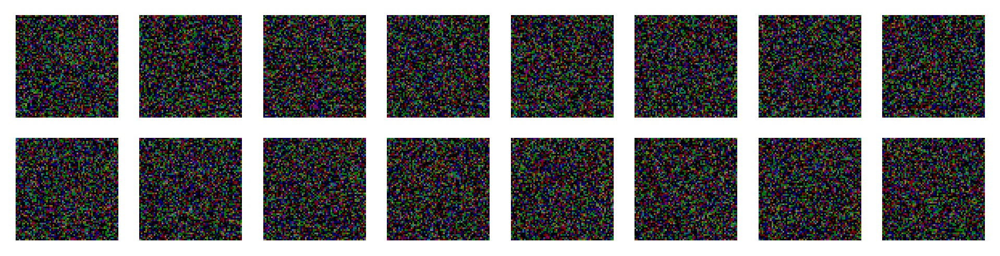

In [47]:
sampler = EulerDiscreteSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=5, start_step=950, end_step=0, priors=None)
plotImages(samples, dpi=300)

In [58]:

class SimpleDDPMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=None) -> tuple[jnp.ndarray, RandomMarkovState]:
        state, rng = state.get_random_key()
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)

        # Compute noise rates and signal rates only once
        current_signal_rate, current_noise_rate = self.noise_schedule.get_rates(current_step)
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        
        noise_ratio_squared = (next_noise_rate ** 2) / (current_noise_rate ** 2)
        betas = 1 - ((current_signal_rate ** 2) / (next_signal_rate ** 2))
        gamma = jnp.sqrt(noise_ratio_squared * betas)
        
        next_samples = (1 / (jnp.sqrt(1 - betas) + 1.e-24)) * (current_samples - betas * (pred_noise / current_noise_rate)) + noise * gamma
        
        # next_samples =  (2 - jnp.sqrt(1 - betas)) * current_samples - betas * (pred_noise / current_noise_rate) + noise * gamma#jnp.sqrt(betas)
        # pred_noise_coeff = ((next_noise_rate ** 2) * current_signal_rate) / (current_noise_rate * next_signal_rate)
        
        # next_samples = next_signal_rate * reconstructed_samples + pred_noise_coeff * pred_noise + noise * gamma

        return next_samples, state

100%|██████████| 100/100 [00:04<00:00, 22.46it/s]


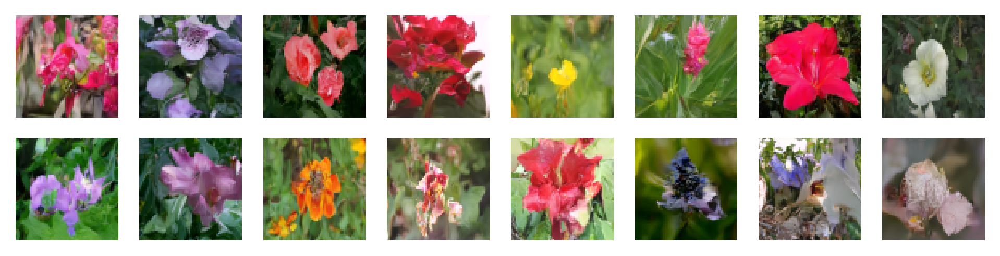

In [59]:
sampler = SimpleDDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:04<00:00, 22.08it/s]


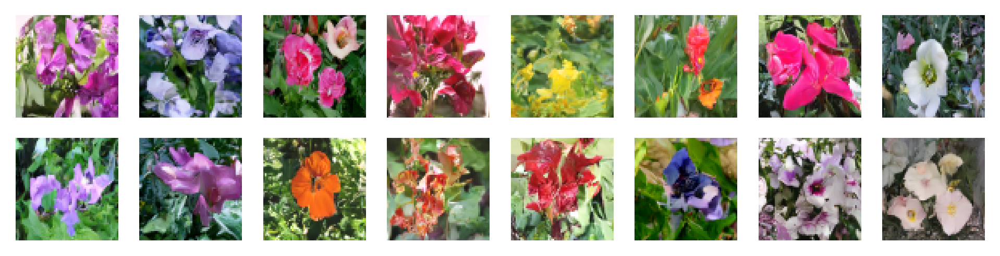

In [57]:
sampler = SimpleDDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, start_step=1000, priors=None)
plotImages(samples, dpi=300)

In [60]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=1000, start_step=1000, priors=None)
plotImages(samples, dpi=300)

 49%|████▉     | 492/1000 [00:10<00:10, 47.64it/s]


KeyboardInterrupt: 

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:08<00:00, 12.11it/s]


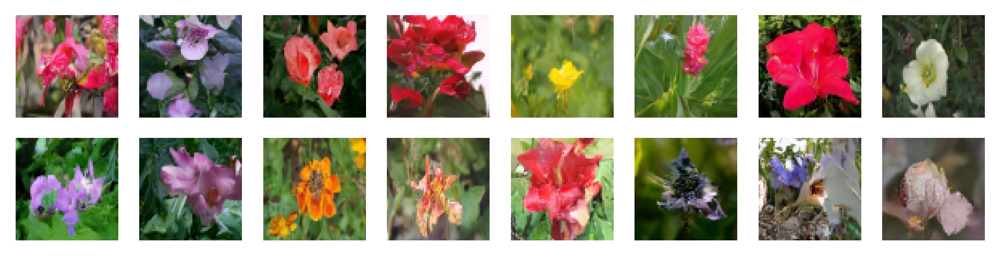

In [18]:
sampler = SimpleDDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:07<00:00, 13.36it/s]


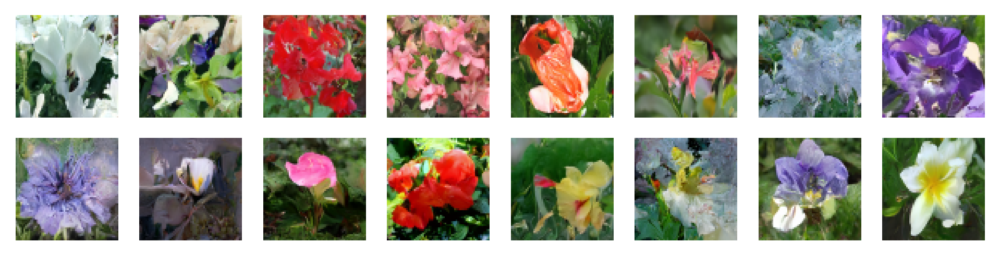

In [260]:
sampler = DDIMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 101/101 [00:07<00:00, 12.98it/s]


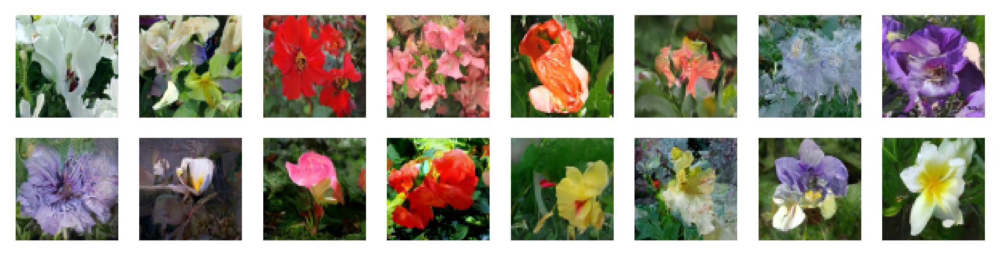

In [21]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, steps_override=[1000] + [i for i in range(0, 1000, 10)][::-1], priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:05<00:00, 17.87it/s]


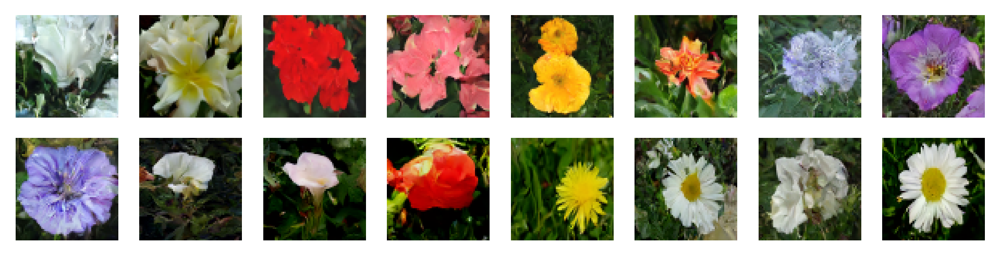

In [16]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:07<00:00, 14.16it/s]


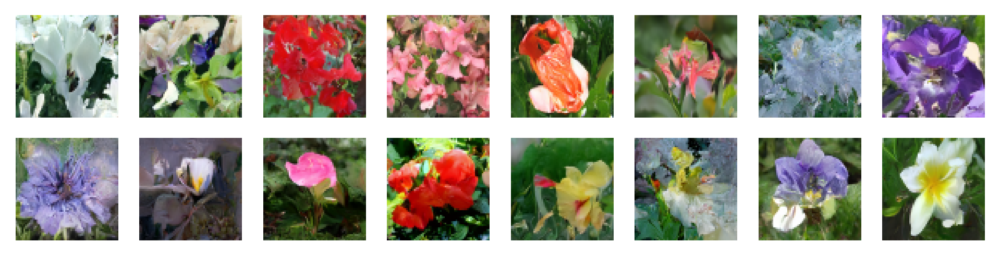

In [67]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:05<00:00, 17.90it/s]


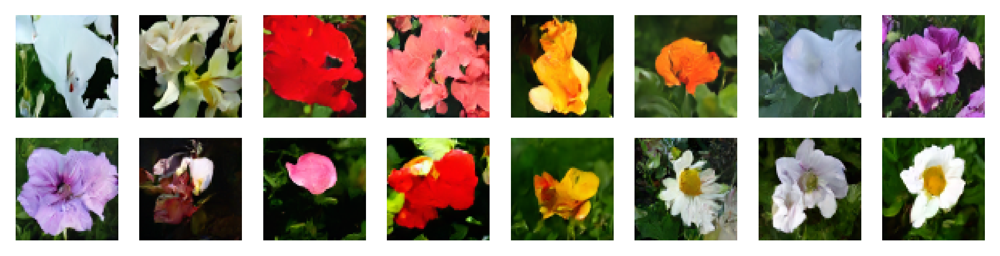

In [16]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:05<00:00, 17.08it/s]


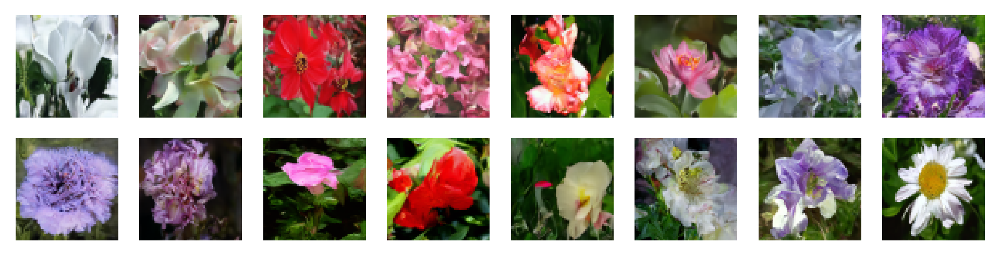

In [26]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:06<00:00, 15.08it/s]


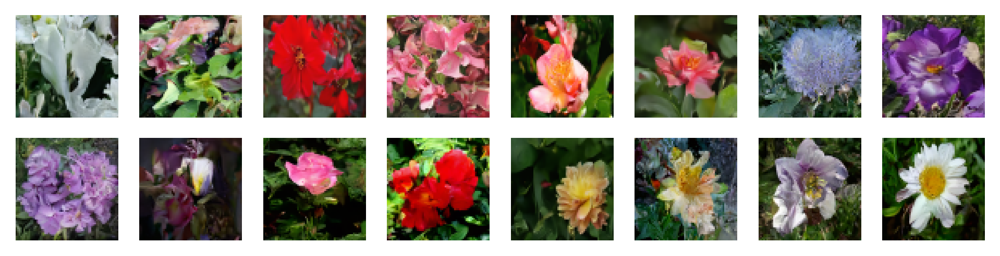

In [42]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 100/100 [00:06<00:00, 16.26it/s]


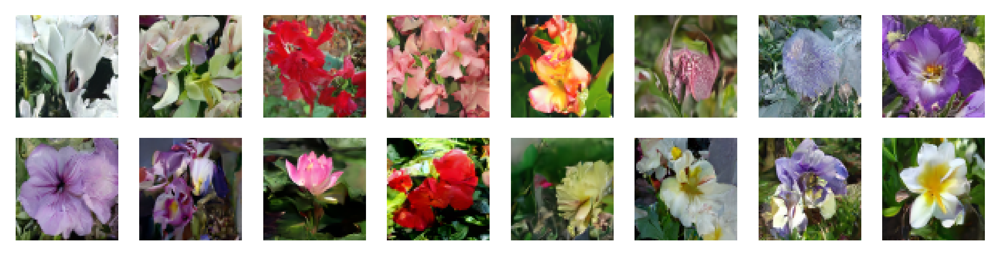

In [26]:
sampler = DDIMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:17<00:00, 56.17it/s]


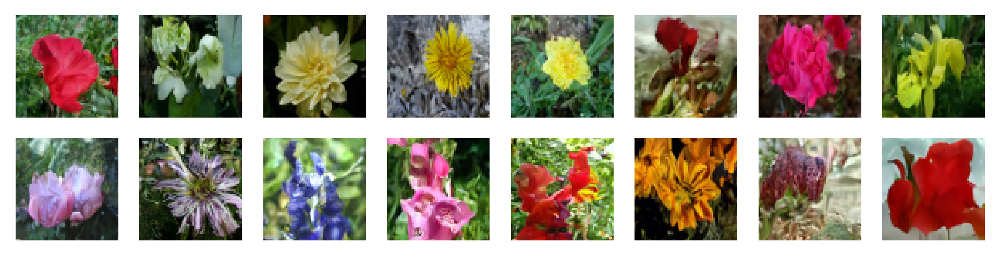

In [68]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)


100%|██████████| 1000/1000 [00:17<00:00, 56.54it/s]


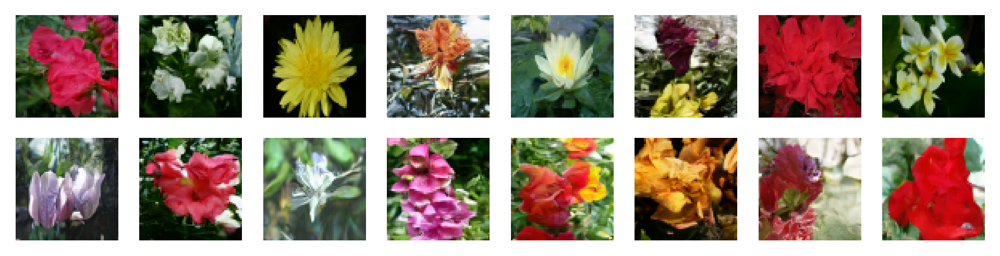

In [56]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:13<00:00, 73.97it/s]


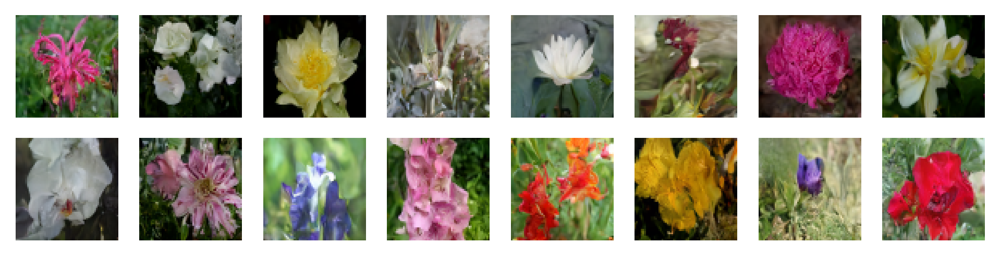

In [20]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:11<00:00, 83.37it/s]


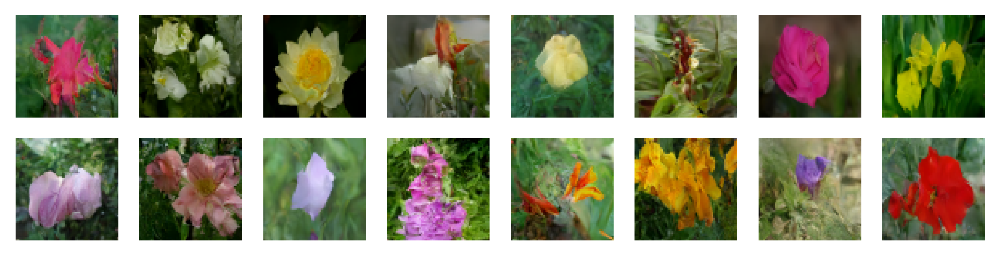

In [37]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:16<00:00, 60.51it/s]


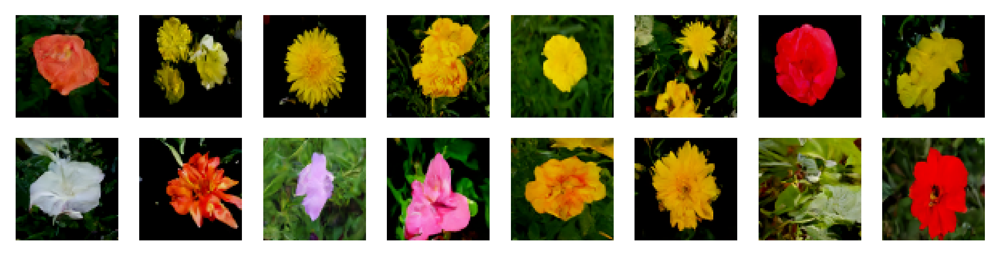

In [12]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:16<00:00, 61.99it/s]


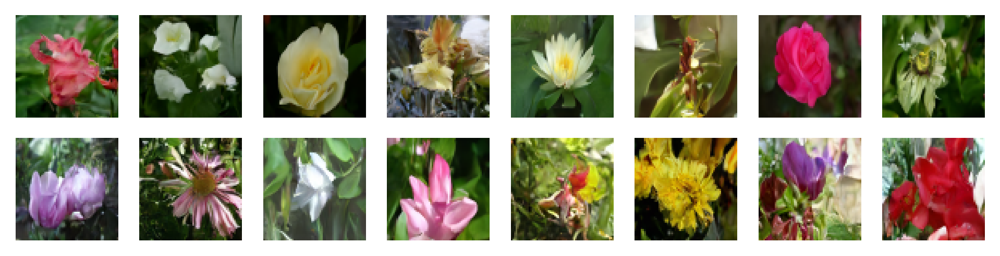

In [43]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:09<00:00, 103.60it/s]


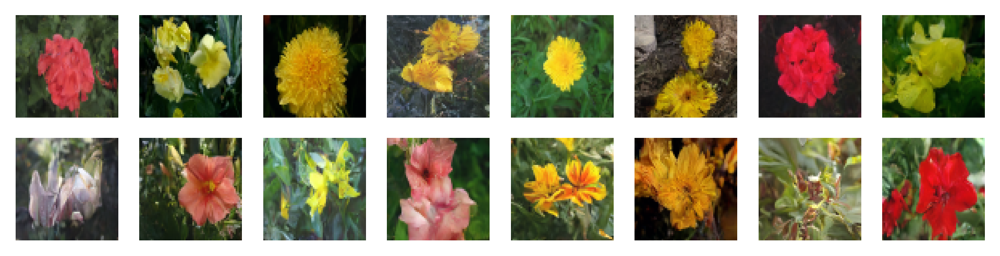

In [91]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

  0%|          | 0/1000 [00:00<?, ?it/s]

[]


100%|██████████| 1000/1000 [00:15<00:00, 65.72it/s]


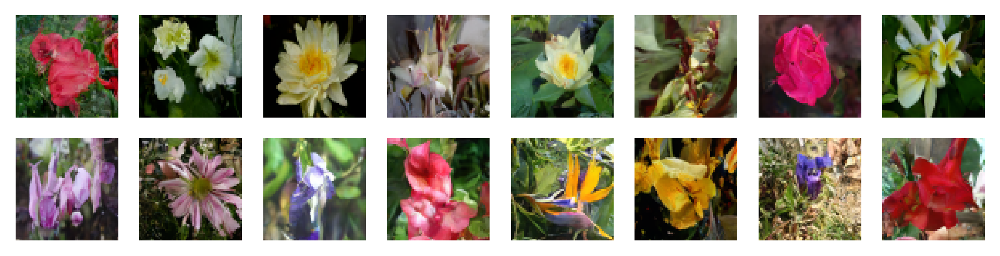

In [28]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 1000/1000 [00:14<00:00, 68.11it/s]


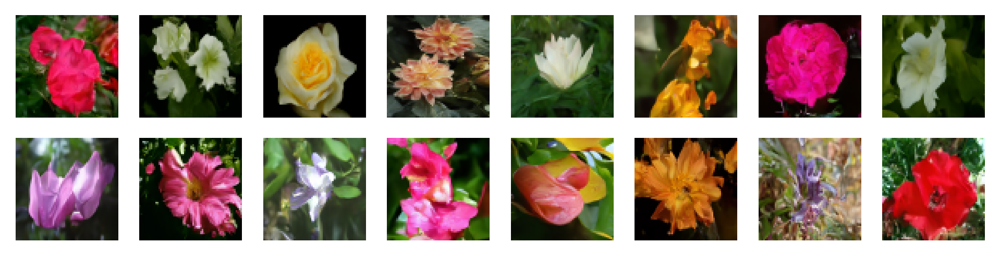

In [28]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 999/999 [00:14<00:00, 69.16it/s] 


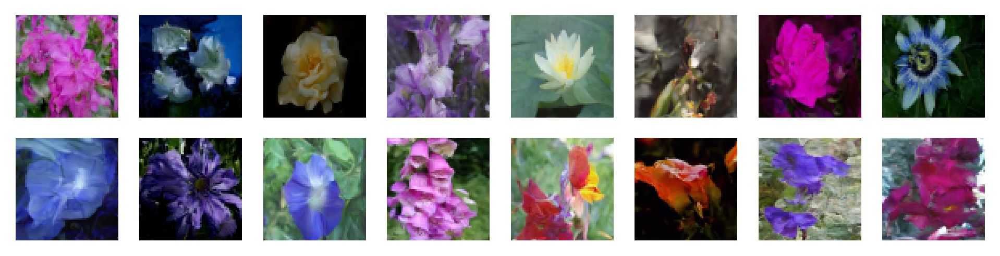

In [254]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=999, priors=None)
plotImages(samples, dpi=300)

1000it [00:23, 42.53it/s]


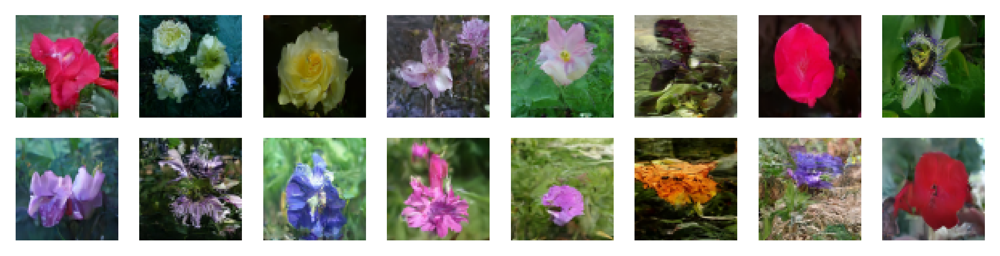

In [33]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=999, priors=None)
plotImages(samples, dpi=300)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:05<00:00,  9.60it/s]


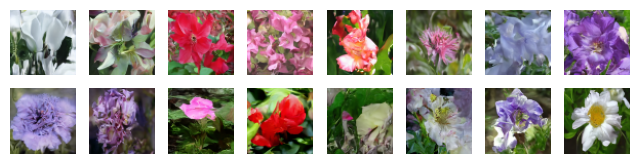

In [37]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=50, start_step=1000, end_step=0, priors=None)
plotImages(samples)

100%|██████████| 1000/1000 [01:11<00:00, 13.89it/s]


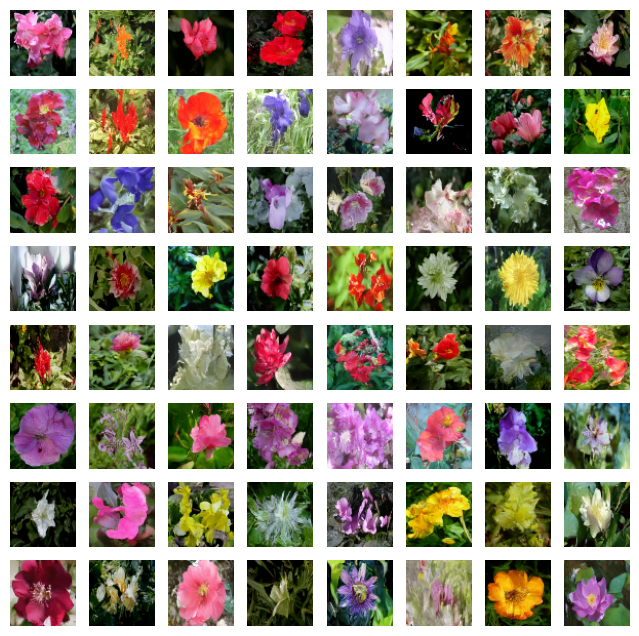

In [18]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)

100%|██████████| 1000/1000 [00:48<00:00, 20.70it/s]


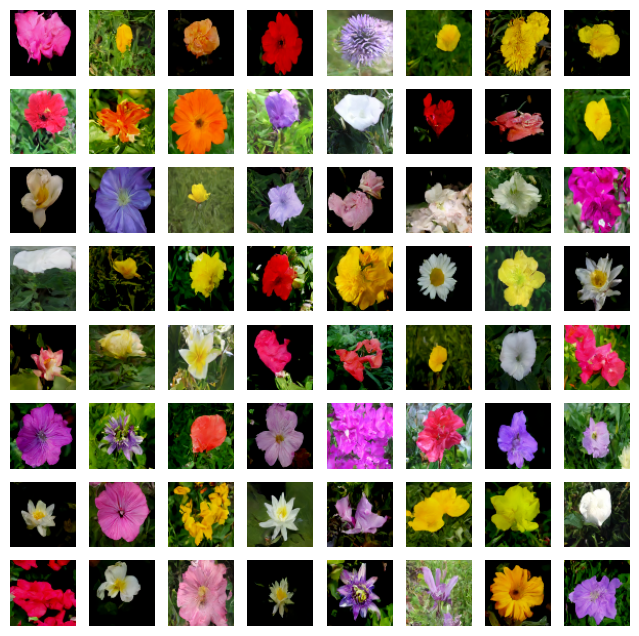

In [13]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

[]


100%|██████████| 1000/1000 [00:56<00:00, 17.73it/s]


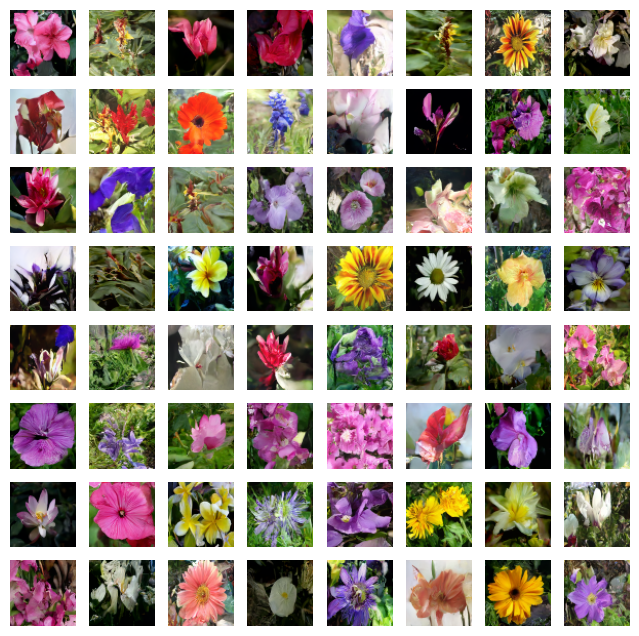

In [29]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:47<00:00, 21.05it/s]


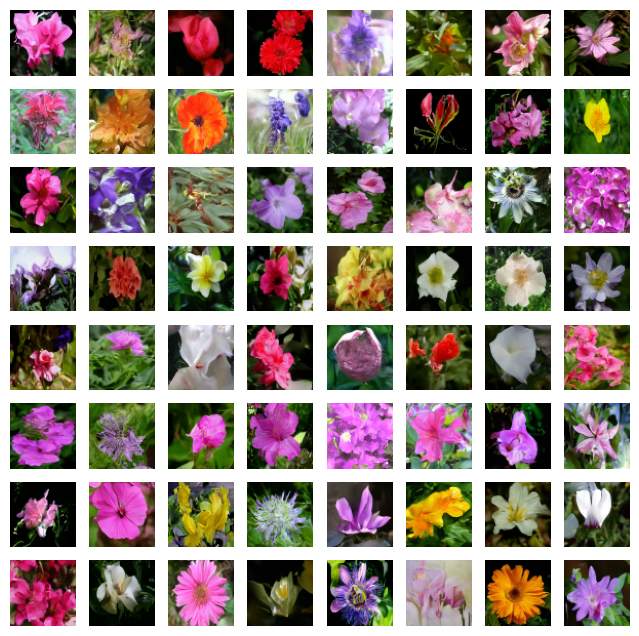

In [38]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)

100%|██████████| 84/84 [00:08<00:00, 10.06it/s]


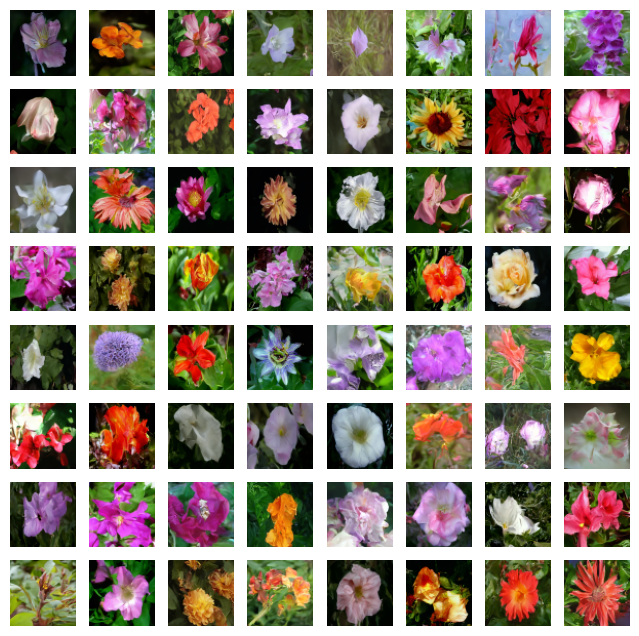

In [40]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, diffusion_steps=80, priors=None)
plotImages(samples)

1000it [01:41,  9.85it/s]


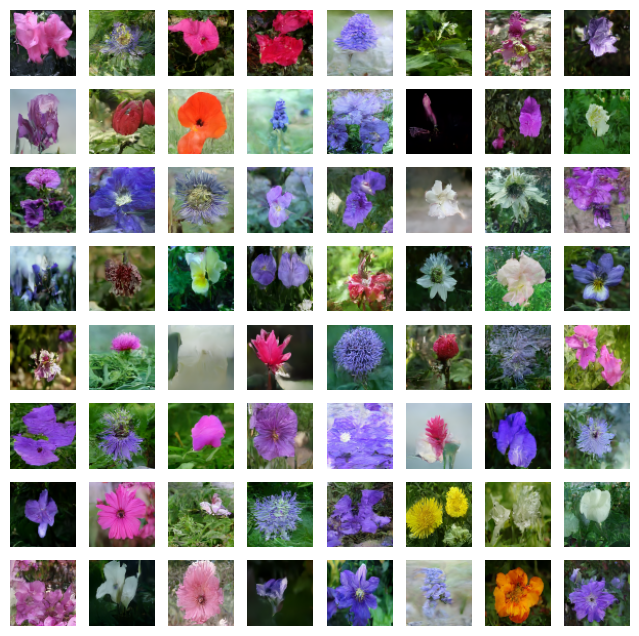

In [27]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:11,  8.64it/s]


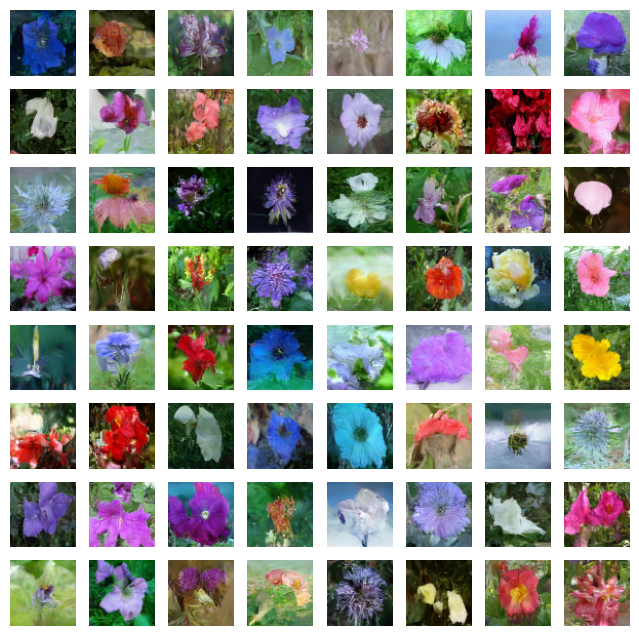

In [32]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:17, 12.87it/s]


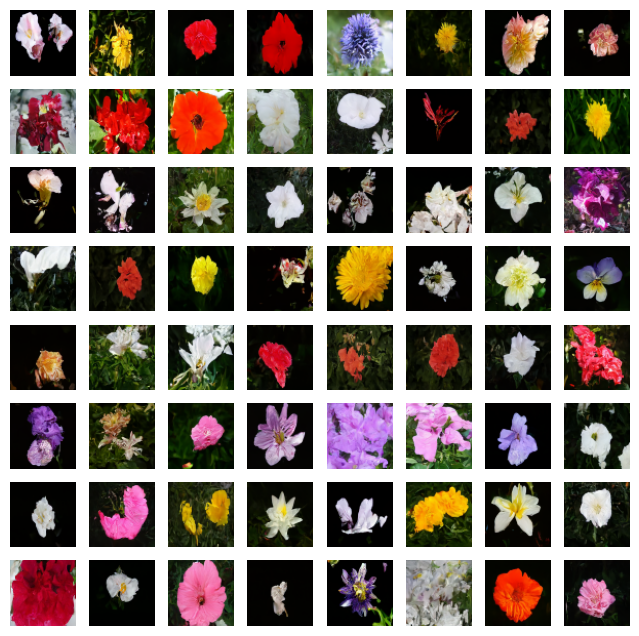

In [36]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:09, 10.89it/s]


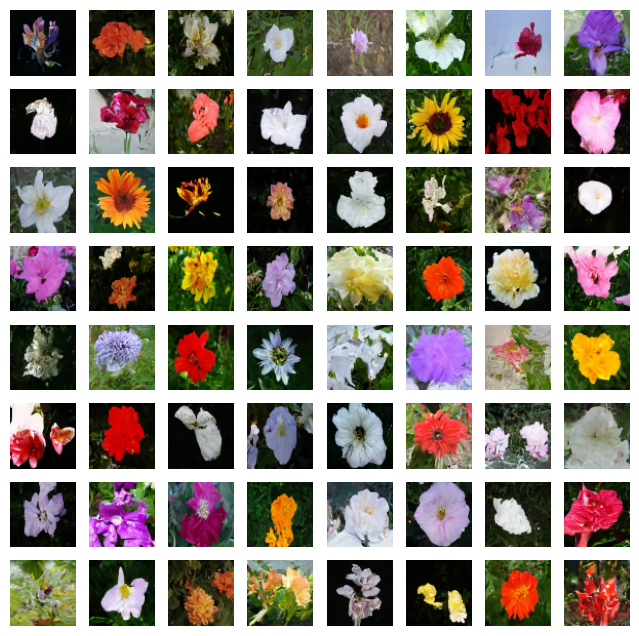

In [35]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:18, 12.72it/s]


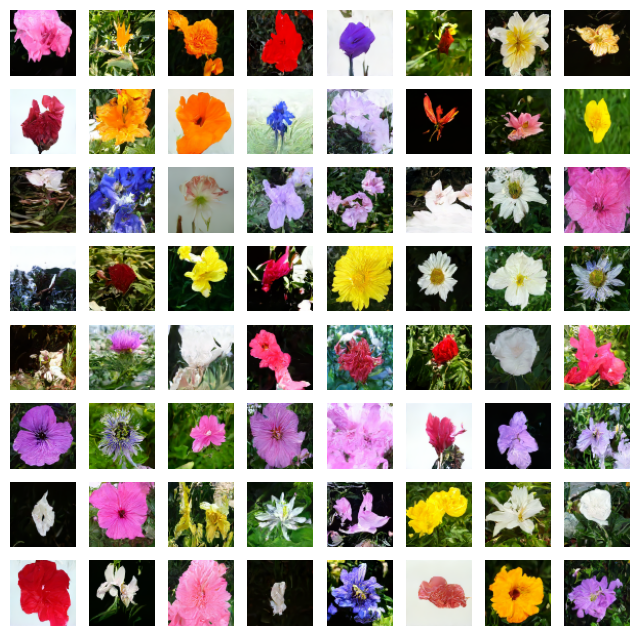

In [34]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:14,  7.10it/s]


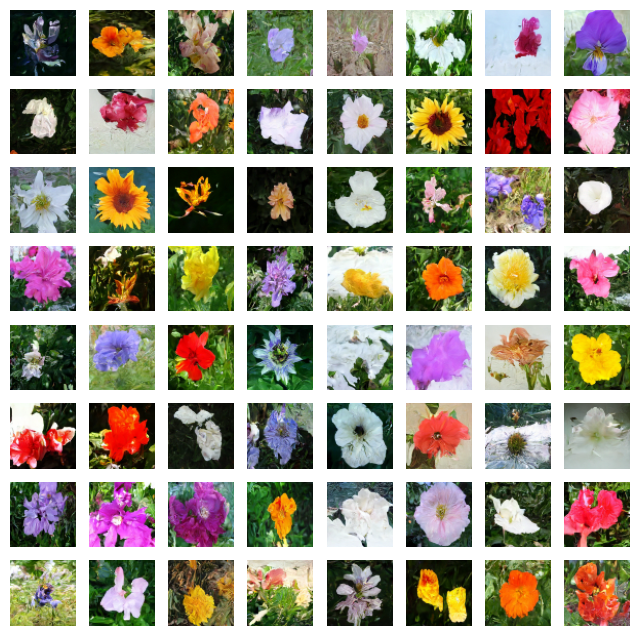

In [33]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [00:12, 82.85it/s]


Samples (64, 64, 64, 3) -0.99983406 0.99983406 -0.3262726


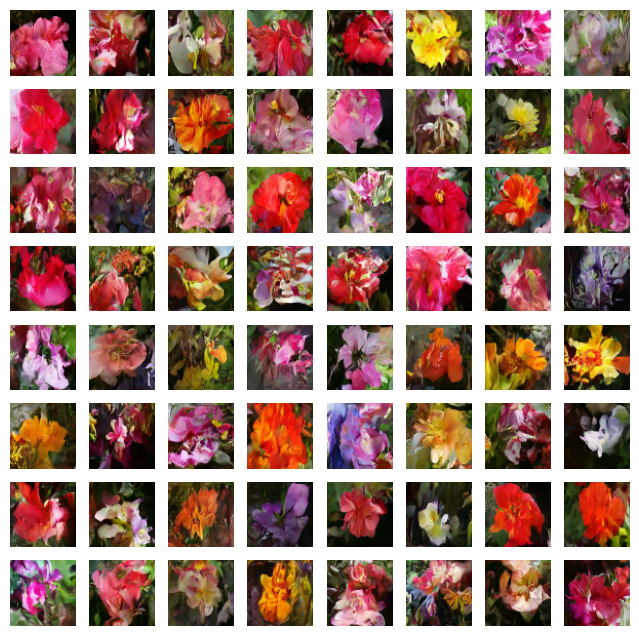

In [26]:
samples = generate_images(trainer.state, trainer.schedule, num_images=64, diffusion_steps=1000)
plotImages(samples)